In [1]:
from keras import backend as k

In [2]:
k.clear_session()

In [3]:
import tensorflow as tf
import os, shutil
import numpy as np
import tensorflow_datasets as tfds
import pandas as pd
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras import models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, Input, BatchNormalization, Lambda
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras import utils

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
original_dataset_dir = '/content/drive/MyDrive/chest_x_ray'
train_dir = "/content/drive/MyDrive/chest_x_ray/train_images"
train_labels= pd.read_csv("/content/drive/MyDrive/chest_x_ray/labels_train.csv")
validation_images = '/content/drive/MyDrive/chest_x_ray/validation_images'
test_dir = '/content/drive/MyDrive/chest_x_ray/test'

In [ ]:
class0 = '/content/drive/MyDrive/chest_x_ray/test/class0'
class1 = '/content/drive/MyDrive/chest_x_ray/test/class1'
class2 = '/content/drive/MyDrive/chest_x_ray/test/class2'

In [ ]:
validation_images = '/content/drive/MyDrive/chest_x_ray/validation_images'
os.mkdir(validation_images)

In [ ]:
os.makedirs("/content/drive/MyDrive/chest_x_ray/train_images/class0", exist_ok=True) 
os.makedirs("/content/drive/MyDrive/chest_x_ray/train_images/class1", exist_ok=True) 
os.makedirs("/content/drive/MyDrive/chest_x_ray/train_images/class2", exist_ok=True) 

os.makedirs("/content/drive/MyDrive/chest_x_ray/validation_images/class0", exist_ok=True) 
os.makedirs("/content/drive/MyDrive/chest_x_ray/validation_images/class1", exist_ok=True) 
os.makedirs("/content/drive/MyDrive/chest_x_ray/validation_images/class2", exist_ok=True)


train_dataset_size = len(os.listdir(train_dir))


filenames = train_labels['file_name'].values

labels = train_labels['class_id'].values

In [ ]:
split_r = 0.8

for i, (label, filename) in enumerate(zip(labels,filenames)):
  print(f"Saving image {i+1}/{train_dataset_size}", end="\r")
  label = label
  im = plt.imread(os.path.join(train_images, filename), 'jpg')
  split = "train" if np.random.rand()<=split_r else "validation"
  plt.imsave(f"dataset/{split}/class{label}/{filename}", im)

In [ ]:
test_images = '/content/drive/MyDrive/chest_x_ray/test'
os.mkdir(test_images)

In [ ]:
os.makedirs("/content/drive/MyDrive/chest_x_ray/test/class0", exist_ok=True) 
os.makedirs("/content/drive/MyDrive/chest_x_ray/test/class1", exist_ok=True) 
os.makedirs("/content/drive/MyDrive/chest_x_ray/test/class2", exist_ok=True) 

In [ ]:
test_class0 = "/content/drive/MyDrive/chest_x_ray/test/class0"
test_class1 = "/content/drive/MyDrive/chest_x_ray/test/class1"
test_class2 = "/content/drive/MyDrive/chest_x_ray/test/class2"

In [ ]:
t_class0 = "/content/drive/MyDrive/chest_x_ray/train_images/class0"
t_class1 = "/content/drive/MyDrive/chest_x_ray/train_images/class1"
t_class2 = "/content/drive/MyDrive/chest_x_ray/train_images/class2"

In [ ]:
filenames = os.listdir(t_class0)
for filename  in filenames[:10]:
  src = os.path.join(t_class0, filename)
  dst = os.path.join(test_class0, filename)
  shutil.move(src, dst)

filenames = os.listdir(t_class1)
for filename  in filenames[:10]:
  src = os.path.join(t_class1, filename)
  dst = os.path.join(test_class1, filename)
  shutil.move(src, dst)

filenames = os.listdir(t_class2)
for filename  in filenames[:10]:
  src = os.path.join(t_class2, filename)
  dst = os.path.join(test_class2, filename)
  shutil.move(src, dst)  

In [ ]:
print('total train_class0 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/train_images/class0")))
print('total train_class1 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/train_images/class1")))
print('total train_class2 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/train_images/class2")))
print('total validation_class0 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/validation_images/class0")))
print('total validation_class1 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/validation_images/class1")))
print('total validation_class2 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/validation_images/class2")))
print('total test_class0 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/test/class0")))
print('total test_class1 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/test/class1")))
print('total test_class2 images:', len(os.listdir("/content/drive/MyDrive/chest_x_ray/test/class2")))

total train_class0 images: 958
total train_class1 images: 1810
total train_class2 images: 962
total validation_class0 images: 259
total validation_class1 images: 418
total validation_class2 images: 235
total test_class0 images: 10
total test_class1 images: 10
total test_class2 images: 10


In [ ]:
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

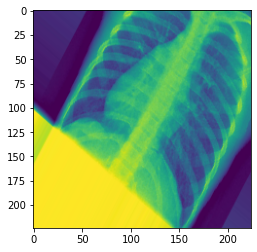

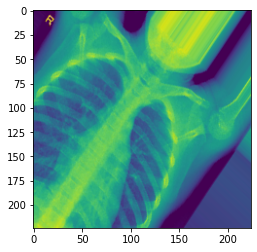

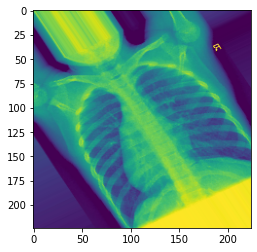

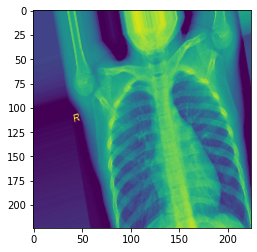

In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras import utils
import numpy as np
#filenames = os.listdir(t_yeast)
fnames = [os.path.join(t_class0, fname) for
          fname in os.listdir(t_class0)]
img=fnames[2]
#fnames = [os.path.join(train_cats_dir, fname) for
 #         fname in os.listdir(train_cats_dir)]
#img_path = fnames[3]
img = utils.load_img(img, target_size=(224, 224))
x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)
i=0
for batch in datagen.flow(x, batch_size=1):
  plt.figure(i)
  imgplot = plt.imshow(image.array_to_img(batch[0]))
  i += 1
  if i % 4 == 0:
    break
plt.show()  

In [ ]:
filenames = os.listdir(t_class0)

In [ ]:
filenames [1]

'img_1995822541707938171.jpg'

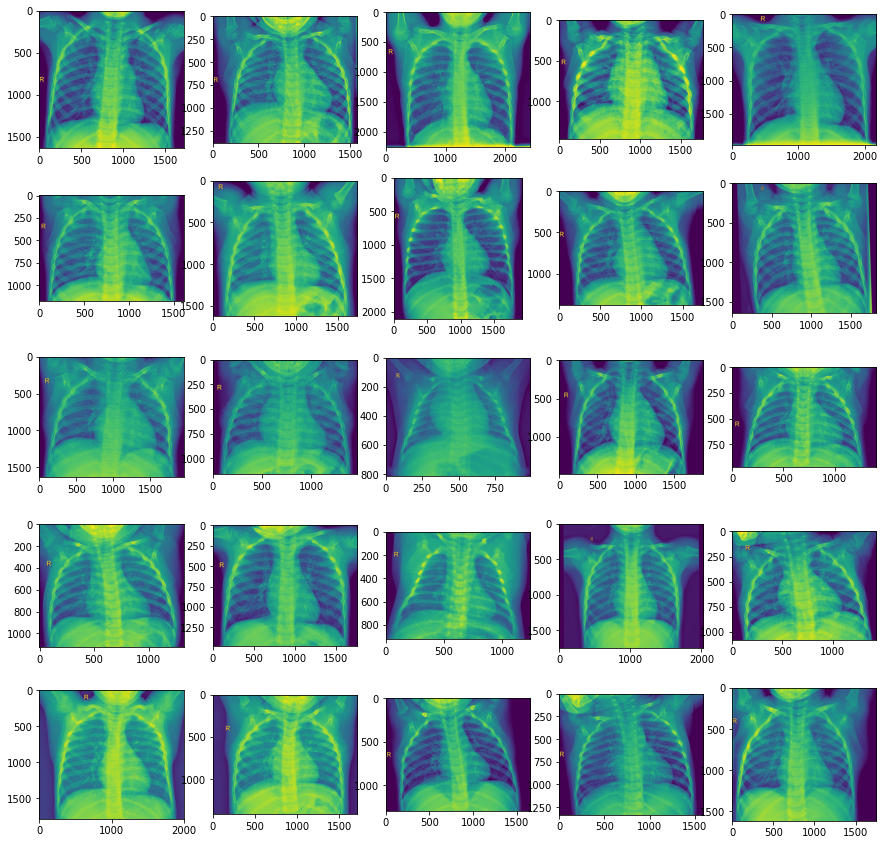

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras import utils
plt.figure(figsize=(15,15))
#TAMANO_IMG=100
#fnames = [os.path.join(t_yeast, fname) for
      #    fname in os.listdir(t_yeast)]
#img_path = fnames[3]
#img = utils.load_img(img_path, target_size=(150, 150))

for i, nombreimg in enumerate(filenames[:25]):
  plt.subplot(5,5,i+1)

  imagen = mpimg.imread(t_class0 + '/' + nombreimg)

  plt.imshow(imagen)

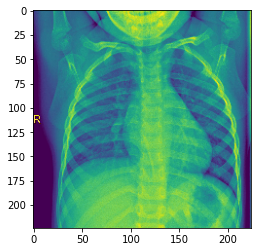

In [ ]:
from tensorflow.keras import utils
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
img_path = fnames[1]
img = utils.load_img(img_path, target_size=(224, 224))
img_tensor = utils.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [ ]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),
    batch_size=32,
    class_mode="categorical")

validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
validation_generator = validation_datagen.flow_from_directory(
    validation_images,
    target_size=(224,224),
    batch_size=32,
    class_mode = "categorical")

Found 3730 images belonging to 3 classes.
Found 912 images belonging to 3 classes.


In [ ]:
from tensorflow.keras import regularizers
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3),  kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Conv2D(64, (3, 3),  kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.MaxPooling2D((2, 2),  strides=(2, 2)))

model.add(layers.Conv2D(128, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Conv2D(128, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

model.add(layers.Conv2D(256, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))

model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

model.add(layers.Flatten())

model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))

In [ ]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    epochs=20,
    validation_data= validation_generator
    )

Epoch 1/20
117/117 [==============================] - 1390s 12s/step - loss: 5.9877 - accuracy: 0.5989 - val_loss: 1.0000 - val_accuracy: 0.6875
Epoch 2/20
117/117 [==============================] - 99s 844ms/step - loss: 0.9104 - accuracy: 0.7394 - val_loss: 0.7894 - val_accuracy: 0.7807
Epoch 3/20
117/117 [==============================] - 98s 839ms/step - loss: 0.7528 - accuracy: 0.7783 - val_loss: 0.6473 - val_accuracy: 0.7917
Epoch 4/20
117/117 [==============================] - 101s 863ms/step - loss: 0.6425 - accuracy: 0.7941 - val_loss: 0.7560 - val_accuracy: 0.7763
Epoch 5/20
117/117 [==============================] - 109s 930ms/step - loss: 0.5818 - accuracy: 0.8193 - val_loss: 0.6266 - val_accuracy: 0.8037
Epoch 6/20
117/117 [==============================] - 108s 920ms/step - loss: 0.5299 - accuracy: 0.8322 - val_loss: 0.5771 - val_accuracy: 0.8246
Epoch 7/20
117/117 [==============================] - 100s 857ms/step - loss: 0.4783 - accuracy: 0.8539 - val_loss: 0.6507 - va

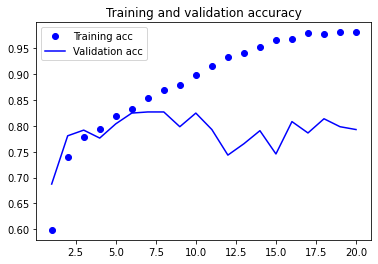

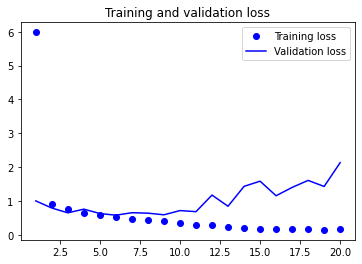

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
model.save("/content/drive/MyDrive/chest_x_ray/model_1.h")
model.save_weights("/content/drive/MyDrive/chest_x_ray/pesos_1.h")

In [ ]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
test_generator = test_datagen.flow_from_directory(
 test_dir,
 target_size=(224,224),
 batch_size=32,
 shuffle=False,
 seed=42,
 class_mode="categorical")

test_generator.reset()
x = model.evaluate_generator(test_generator,
                             steps = np.ceil(len(test_generator) / 32),
                             use_multiprocessing = False,
                             verbose = 1,
                             workers=1)
print("Test loss:" , x[0])
print("Test accuracy:",x[1])

Found 30 images belonging to 3 classes.


<ipython-input-12-5e74875c24d8>:11: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  x = model.evaluate_generator(test_generator,


1/1 [==============================] - 1s 1s/step - loss: 2.5544 - accuracy: 0.3333
Test loss: 2.554370164871216
Test accuracy: 0.3333333432674408


**Heat Map**

In [ ]:
for idx in range(len(model.layers)):
  print(model.get_layer(index = idx).name)

conv2d
max_pooling2d
conv2d_1
conv2d_2
max_pooling2d_1
conv2d_3
conv2d_4
max_pooling2d_2
conv2d_5
max_pooling2d_3
flatten
dense
dense_1


In [ ]:
img_class0 ='/content/drive/MyDrive/chest_x_ray/test/class0/img_1575849049541638179.jpg'
img_class1 ='/content/drive/MyDrive/chest_x_ray/test/class1/img_9198611719791156730.jpg'
img_class2 ='/content/drive/MyDrive/chest_x_ray/test/class2/img_3753314631059921298.jpg'

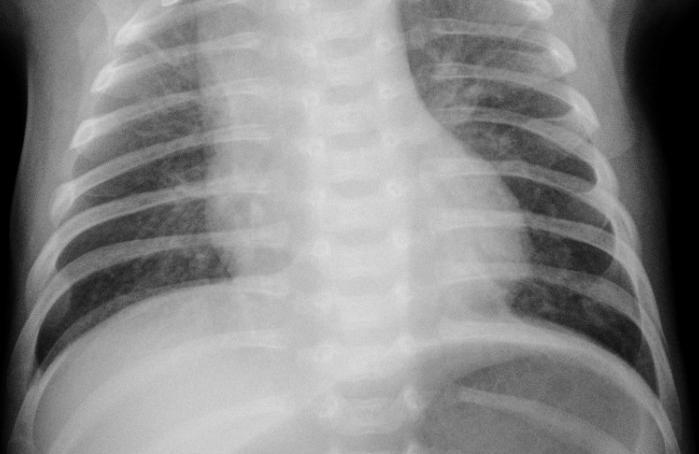

In [ ]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
img_size = (224, 224)


last_conv_layer_name = "conv2d_5"

# The local path to our target image
img_path = img_class2
display(Image(img_path))

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

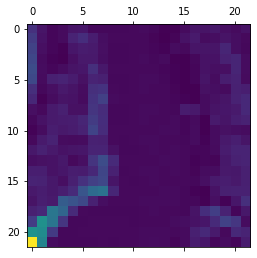

In [ ]:
img_array = preprocess_input(get_img_array(img_path, size=img_size))


# Remove last layer's softmax
model.layers[-1].activation = None



# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

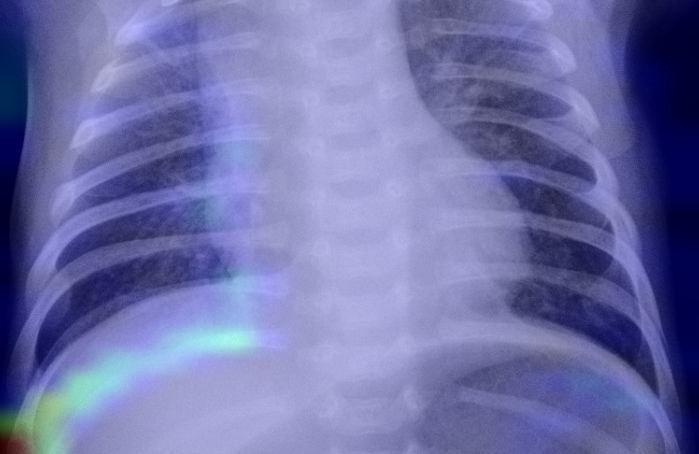

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

**Grad-CAM Class Activation Visualization**

In [ ]:
test_generator.reset() 
pred = model.predict_generator(test_generator,1000,verbose=1)
print("Predictions finished")
import cv2
import matplotlib.image as mpimg
for index, probability in enumerate(pred):
 image_path = test_dir + "/" +test_generator.filenames[index]
 image = mpimg.imread(image_path)
 #BGR TO RGB conversion using CV2
 image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
 pixels = np.array(image)
 plt.imshow(pixels)
 

 plt.show()

In [ ]:
class GradCAM:
    def __init__(self, model, classs, layerName=None):
        # store the model, the class index used to measure the class
        # activation map, and the layer to be used when visualizing
        # the class activation map
        self.model = model
        self.classs = classs
        self.layerName = layerName
        # if the layer name is None, attempt to automatically find
        # the target output layer
        if self.layerName is None:
            self.layerName = self.find_target_layer()

    def find_target_layer(self):
        # attempt to find the final convolutional layer in the network
        # by looping over the layers of the network in reverse order
        for layer in reversed(self.model.layers):
            # check to see if the layer has a 4D output
            if len(layer.output_shape) == 4:
                return layer.name
        # otherwise, we could not find a 4D layer so the GradCAM
        # algorithm cannot be applied
        raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")


    def compute_heatmap(self, image, eps=1e-8):
        # construct our gradient model by supplying (1) the inputs
        # to our pre-trained model, (2) the output of the (presumably)
        # final 4D layer in the network, and (3) the output of the
        # softmax activations from the model
        gradModel = Model(
            inputs=[self.model.inputs],
            outputs=[self.model.get_layer(self.layerName).output, self.model.output])

        # record operations for automatic differentiation
        with tf.GradientTape() as tape:
            # cast the image tensor to a float-32 data type, pass the
            # image through the gradient model, and grab the loss
            # associated with the specific class index
            inputs = tf.cast(image, tf.float32)
            (convOutputs, predictions) = gradModel(inputs)
            
            loss = predictions[:, tf.argmax(predictions[0])]
    
        # use automatic differentiation to compute the gradients
        grads = tape.gradient(loss, convOutputs)

        # compute the guided gradients
        castConvOutputs = tf.cast(convOutputs > 0, "float32")
        castGrads = tf.cast(grads > 0, "float32")
        guidedGrads = castConvOutputs * castGrads * grads
        # the convolution and guided gradients have a batch dimension
        # (which we don't need) so let's grab the volume itself and
        # discard the batch
        convOutputs = convOutputs[0]
        guidedGrads = guidedGrads[0]

        # compute the average of the gradient values, and using them
        # as weights, compute the ponderation of the filters with
        # respect to the weights
        weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
        cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)

        # grab the spatial dimensions of the input image and resize
        # the output class activation map to match the input image
        # dimensions
        (w, h) = (image.shape[2], image.shape[1])
        heatmap = cv2.resize(cam.numpy(), (w, h))
        # normalize the heatmap such that all values lie in the range
        # [0, 1], scale the resulting values to the range [0, 255],
        # and then convert to an unsigned 8-bit integer
        numer = heatmap - np.min(heatmap)
        denom = (heatmap.max() - heatmap.min()) + eps
        heatmap = numer / denom
        heatmap = (heatmap * 255).astype("uint8")
        # return the resulting heatmap to the calling function
        return heatmap

    def overlay_heatmap(self, heatmap, image, alpha=0.5,
                        colormap=cv2.COLORMAP_VIRIDIS):
        # apply the supplied color map to the heatmap and then
        # overlay the heatmap on the input image
        heatmap = cv2.applyColorMap(heatmap, colormap)
        output = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
        # return a 2-tuple of the color mapped heatmap and the output,
        # overlaid image
        return (heatmap, output)

In [ ]:
last_conv_layer = "conv2d_5"

In [ ]:
# PREDICTION ON A VIRAL X-RAY
img_path = img_class2

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 352ms/step


In [ ]:
icam = GradCAM(model, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


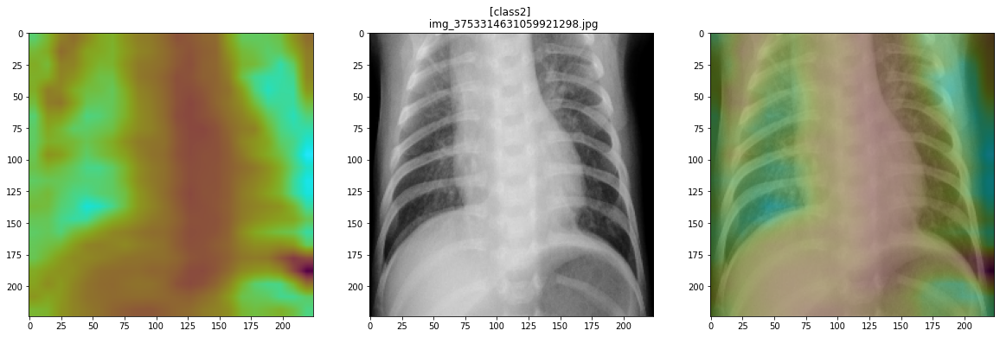

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam1.png', bbox_inches='tight', dpi=300);

In [ ]:
# PREDICTION ON A BACTERIAL PNEUMONIA X-RAY
img_path = img_class1

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 20ms/step


In [ ]:
icam = GradCAM(model, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


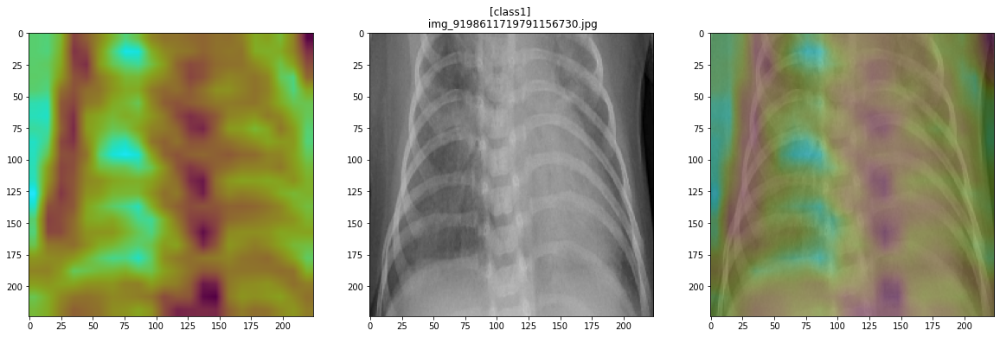

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam2.png', bbox_inches='tight', dpi=300);

In [ ]:
# PREDICTION ON A NORMAL X-RAY
img_path = img_class0

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 21ms/step


In [ ]:
icam = GradCAM(model, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


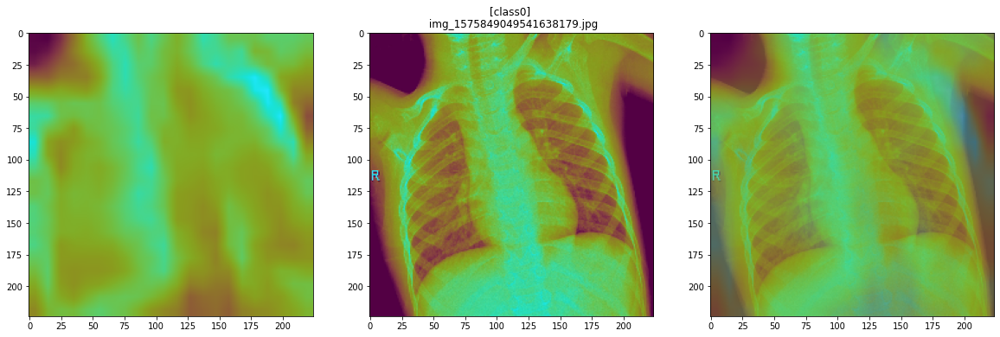

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam3.png', bbox_inches='tight', dpi=300);

________________________________________________________________________________________________________________
________________________________________________________________________________________________________________
_________________________________________________________________________________________________________________

In [ ]:
train_datagen = ImageDataGenerator(
   preprocessing_function=preprocess_input,  
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3, 
    vertical_flip = True,
    channel_shift_range = 20,
    horizontal_flip=True)

validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_directory(
    train_dir, 
    target_size=(224, 224), 
    batch_size=32,
    class_mode="categorical") 

validation_generator = validation_datagen.flow_from_directory(
    validation_images, 
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

Found 3730 images belonging to 3 classes.
Found 912 images belonging to 3 classes.


In [ ]:
from tensorflow.keras import regularizers
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3),  kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Conv2D(64, (3, 3),  kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.MaxPooling2D((2, 2),  strides=(2, 2)))

model.add(layers.Conv2D(128, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Conv2D(128, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

model.add(layers.Conv2D(256, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Conv2D(256, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Conv2D(256, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))

In [ ]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data= validation_generator
    )

Epoch 1/30
117/117 [==============================] - 143s 1s/step - loss: 3.5117 - accuracy: 0.4651 - val_loss: 1.6470 - val_accuracy: 0.4583
Epoch 2/30
117/117 [==============================] - 153s 1s/step - loss: 1.3686 - accuracy: 0.5560 - val_loss: 1.0527 - val_accuracy: 0.6250
Epoch 3/30
117/117 [==============================] - 158s 1s/step - loss: 1.0436 - accuracy: 0.5949 - val_loss: 0.9778 - val_accuracy: 0.6338
Epoch 4/30
117/117 [==============================] - 162s 1s/step - loss: 0.9598 - accuracy: 0.6185 - val_loss: 0.8772 - val_accuracy: 0.6535
Epoch 5/30
117/117 [==============================] - 165s 1s/step - loss: 0.8923 - accuracy: 0.6349 - val_loss: 0.8167 - val_accuracy: 0.6875
Epoch 6/30
117/117 [==============================] - 165s 1s/step - loss: 0.8376 - accuracy: 0.6630 - val_loss: 0.7614 - val_accuracy: 0.7039
Epoch 7/30
117/117 [==============================] - 154s 1s/step - loss: 0.8108 - accuracy: 0.6718 - val_loss: 0.7040 - val_accuracy: 0.7292

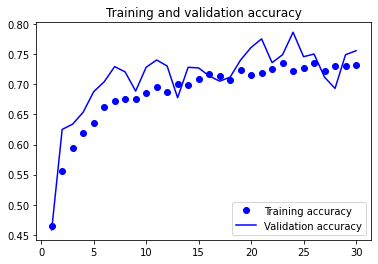

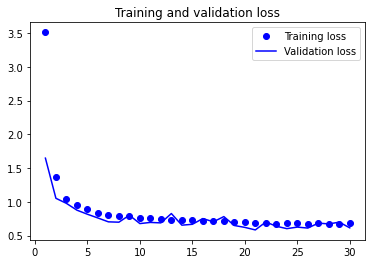

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

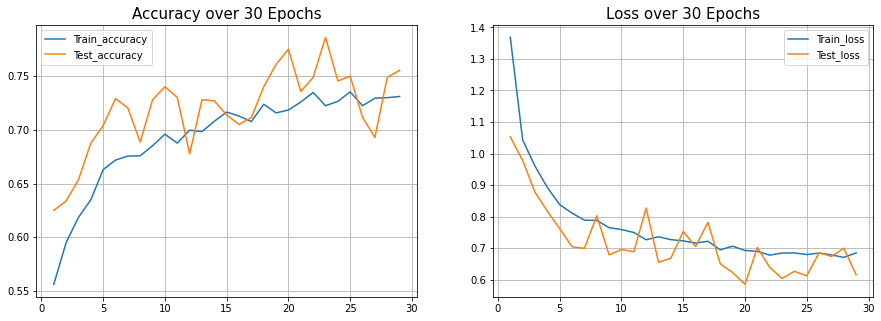

In [ ]:
def plot_acc_loss(result, epochs):
 acc = result.history["accuracy"]
 loss = result.history["loss"]
 val_acc = result.history["val_accuracy"]
 val_loss = result.history["val_loss"]
 plt.figure(figsize=(15, 5))
 plt.subplot(121)
 plt.plot(range(1,epochs), acc[1:], label="Train_accuracy")
 plt.plot(range(1,epochs), val_acc[1:], label="Test_accuracy")
 plt.title("Accuracy over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.subplot(122)
 plt.plot(range(1,epochs), loss[1:], label="Train_loss")
 plt.plot(range(1,epochs), val_loss[1:], label="Test_loss")
 plt.title("Loss over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.show()
 
plot_acc_loss(history, 30)

In [ ]:
model.save("/content/drive/MyDrive/chest_x_ray/model_2.h")
model.save_weights("/content/drive/MyDrive/chest_x_ray/pesos_2.h")

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 30 images belonging to 3 classes.


<ipython-input-44-dc5568437911>:7: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)


test acc: 0.3333333432674408


In [ ]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
test_generator = test_datagen.flow_from_directory(
 test_dir,
 target_size=(224,224),
 batch_size=32,
 shuffle=False,
 seed=42,
 class_mode="categorical")

test_generator.reset()
x = model.evaluate_generator(test_generator,
                             steps = np.ceil(len(test_generator) / 32),
                             use_multiprocessing = False,
                             verbose = 1,
                             workers=1)
print("Test loss:" , x[0])
print("Test accuracy:",x[1])

Found 30 images belonging to 3 classes.


<ipython-input-45-5e74875c24d8>:11: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  x = model.evaluate_generator(test_generator,


1/1 [==============================] - 1s 672ms/step - loss: 2.4138 - accuracy: 0.3333
Test loss: 2.4137532711029053
Test accuracy: 0.3333333432674408


**Predict**

In [44]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/model_2.h")

In [45]:
import cv2
from imutils import paths
imagePaths = list(paths.list_images(class0))
data = []
labels = []
for imagePath in imagePaths:
    label = 0
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    # update the data and labels lists, respectively
    data.append(image)
    labels.append(label)
data = np.array(data) /255
labels = np.array(labels)

imagePaths1 = list(paths.list_images(class1))
data1 = []
labels1 = []
for imagePath in imagePaths1:
    label1 = 1
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data1.append(image)
    labels1.append(label1)

data1 = np.array(data1) / 255
labels1 = np.array(labels1)

imagePaths2 = list(paths.list_images(class2))
data2 = []
labels2 = []
for imagePath in imagePaths2:
    label2 = 2
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data2.append(image)
    labels2.append(label2)
data2 = np.array(data2) / 255
labels2 = np.array(labels2)

dataset = np.concatenate((data, data1, data2), axis=0)
label = np.concatenate((labels, labels1, labels2), axis=0)

label2 = to_categorical(label)

label1 = to_categorical(label)

In [46]:
from sklearn.metrics import classification_report
BS = 8
print("[INFO] evaluating network...")
predIdxs = model.predict(dataset, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(label1.argmax(axis=1), predIdxs,digits=4))

[INFO] evaluating network...
4/4 [==============================] - 1s 98ms/step
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000        10
           1     0.3333    1.0000    0.5000        10
           2     0.0000    0.0000    0.0000        10

    accuracy                         0.3333        30
   macro avg     0.1111    0.3333    0.1667        30
weighted avg     0.1111    0.3333    0.1667        30



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


acc: 0.3333
sensitivity: 0.0000
specificity: 1.0000


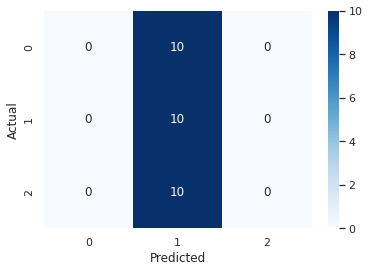

<Figure size 1152x864 with 0 Axes>

In [47]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(label1.argmax(axis=1), predIdxs)
sns.set(font_scale=1)#for label size
sns.heatmap(cm, cmap="Blues", annot=True,annot_kws={"size": 12})# font siz
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.figure(figsize = (16,12))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

1/1 [==============================] - 0s 45ms/step
Total-test-data; 30 	accurately-predicted-data: 10 	 wrongly-predicted-data:  20
Accuracy: 33.333 %


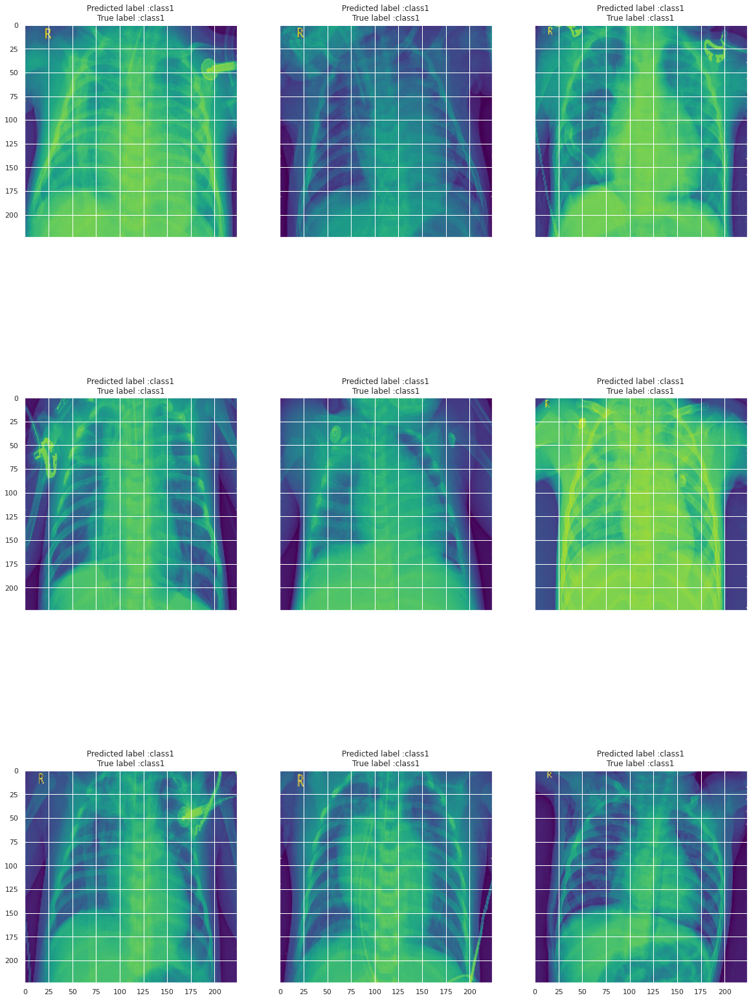

In [50]:
import random
ypred = model.predict(dataset)
total = 0
accurate = 0
accurateindex = []
wrongindex = []

for i in range(len(ypred)):
    if np.argmax(ypred[i]) == np.argmax(label1[i]):
        accurate += 1
        accurateindex.append(i)
    else:
        wrongindex.append(i)
        
    total += 1
    
print('Total-test-data;', total, '\taccurately-predicted-data:', accurate, '\t wrongly-predicted-data: ', total - accurate)
print('Accuracy:', round(accurate/total*100, 3), '%')
label= {0: 'class0', 1: 'class1', 2: 'class2'}
imidx = random.sample(accurateindex, k=9)# replace with 'wrongindex'

nrows = 3
ncols = 3
fig, ax = plt.subplots(nrows,ncols,sharex=True,sharey=True,figsize=(20, 30))

n = 0
for row in range(nrows):
    for col in range(ncols):
            ax[row,col].imshow(dataset[imidx[n]])
            ax[row,col].set_title("Predicted label :{}\nTrue label :{}".format(label[np.argmax(ypred[imidx[n]])], label[np.argmax(label1[imidx[n]])]))
            n += 1

plt.show()

**Visualización de las convnets**

In [ ]:
filenames = os.listdir(t_normal)

In [ ]:
test_generator.reset() 
pred = model.predict_generator(test_generator,1000,verbose=1)
print("Predictions finished")
import cv2
import matplotlib.image as mpimg
for index, probability in enumerate(pred):
 image_path = test_dir + "/" +test_generator.filenames[index]
 image = mpimg.imread(image_path)
 #BGR TO RGB conversion using CV2
 image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
 pixels = np.array(image)
 plt.imshow(pixels)
 
 print(test_generator.filenames[index])
 if probability > 0.5:
   plt.title("%.2f" % (probability[0]*100) + "% Pneumonia")
 else:
   plt.title("%.2f" % ((1-probability[0])*100) + "% Normal")
 plt.show()

In [ ]:
from tensorflow.keras import utils
img_path = img_class2
from keras.preprocessing import image
import numpy as np
img = utils.load_img(img_path, target_size=(224, 224))
img_tensor = utils.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

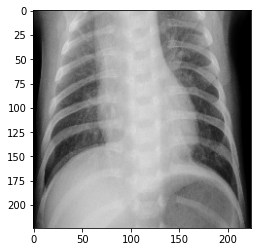

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(img_tensor[0])
plt.show()

In [ ]:
from tensorflow.keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [ ]:
activations = activation_model.predict(img_tensor)

1/1 [==============================] - 0s 85ms/step


In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 222, 222, 32)


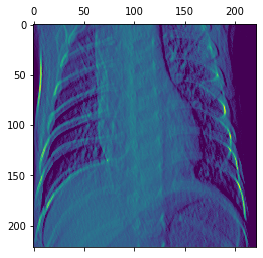

In [ ]:
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

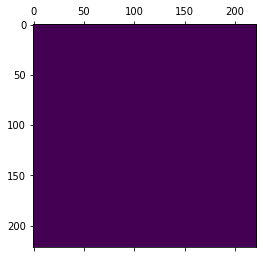

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')

<ipython-input-54-67c32b21b77d>:18: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


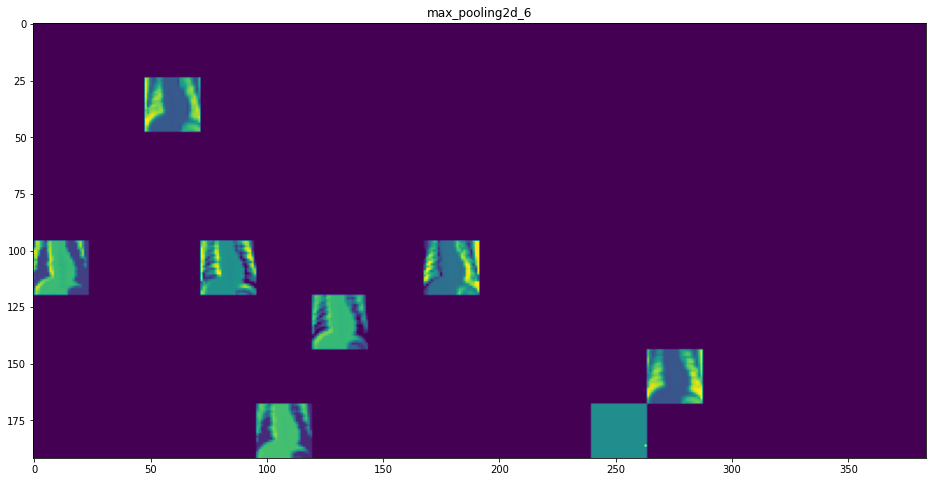

In [ ]:
layer_names = []
for layer in model.layers[:8]:
  layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
  n_features = layer_activation.shape[-1]
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0,
                                       :, :,
                                       col * images_per_row + row]
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[col * size : (col + 1) * size,
                   row * size : (row + 1) * size] = channel_image

scale = 1. / size
plt.figure(figsize=(scale * display_grid.shape[1],
scale * display_grid.shape[0]))
plt.title(layer_name)
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')

**Heat Map**

In [ ]:
for idx in range(len(model.layers)):
  print(model.get_layer(index = idx).name)

conv2d_6
max_pooling2d_4
conv2d_7
conv2d_8
max_pooling2d_5
conv2d_9
conv2d_10
max_pooling2d_6
conv2d_11
conv2d_12
conv2d_13
max_pooling2d_7
flatten_1
dropout
dense_2
dense_3


In [ ]:
img_class0 ='/content/drive/MyDrive/chest_x_ray/test/class0/img_1575849049541638179.jpg'
img_class1 ='/content/drive/MyDrive/chest_x_ray/test/class1/img_9198611719791156730.jpg'
img_class2 ='/content/drive/MyDrive/chest_x_ray/test/class2/img_3753314631059921298.jpg'

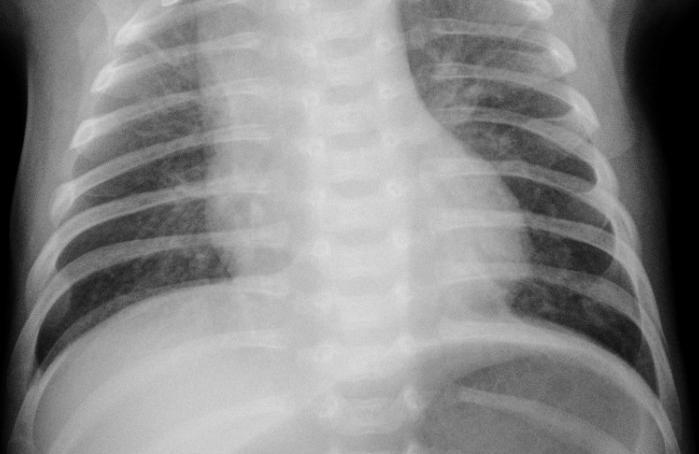

In [ ]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
img_size = (224, 224)


last_conv_layer_name = "conv2d_13"

# The local path to our target image
img_path = img_class2
display(Image(img_path))

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

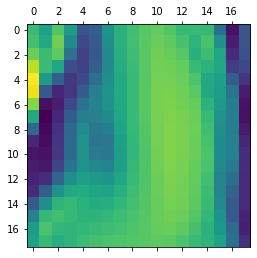

In [ ]:
img_array = preprocess_input(get_img_array(img_path, size=img_size))


# Remove last layer's softmax
model.layers[-1].activation = None



# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

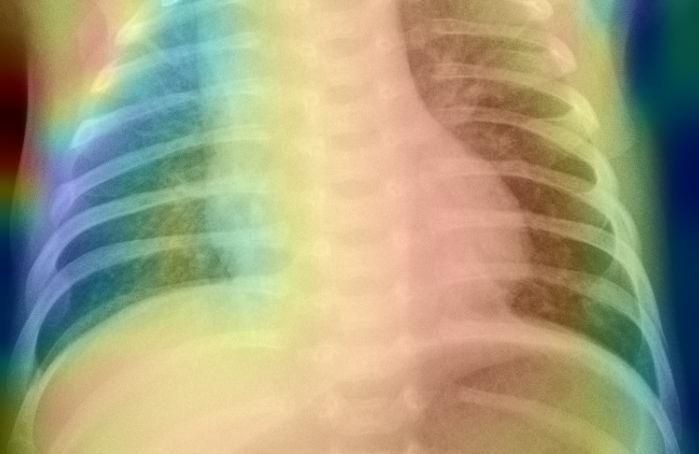

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

**Grad-CAM Class Activation Visualization**

In [ ]:
test_generator.reset() 
pred = model.predict_generator(test_generator,1000,verbose=1)
print("Predictions finished")
import cv2
import matplotlib.image as mpimg
for index, probability in enumerate(pred):
 image_path = test_dir + "/" +test_generator.filenames[index]
 image = mpimg.imread(image_path)
 #BGR TO RGB conversion using CV2
 image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
 pixels = np.array(image)
 plt.imshow(pixels)
 

 plt.show()

In [ ]:
class GradCAM:
    def __init__(self, model, classs, layerName=None):
        # store the model, the class index used to measure the class
        # activation map, and the layer to be used when visualizing
        # the class activation map
        self.model = model
        self.classs = classs
        self.layerName = layerName
        # if the layer name is None, attempt to automatically find
        # the target output layer
        if self.layerName is None:
            self.layerName = self.find_target_layer()

    def find_target_layer(self):
        # attempt to find the final convolutional layer in the network
        # by looping over the layers of the network in reverse order
        for layer in reversed(self.model.layers):
            # check to see if the layer has a 4D output
            if len(layer.output_shape) == 4:
                return layer.name
        # otherwise, we could not find a 4D layer so the GradCAM
        # algorithm cannot be applied
        raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")


    def compute_heatmap(self, image, eps=1e-8):
        # construct our gradient model by supplying (1) the inputs
        # to our pre-trained model, (2) the output of the (presumably)
        # final 4D layer in the network, and (3) the output of the
        # softmax activations from the model
        gradModel = Model(
            inputs=[self.model.inputs],
            outputs=[self.model.get_layer(self.layerName).output, self.model.output])

        # record operations for automatic differentiation
        with tf.GradientTape() as tape:
            # cast the image tensor to a float-32 data type, pass the
            # image through the gradient model, and grab the loss
            # associated with the specific class index
            inputs = tf.cast(image, tf.float32)
            (convOutputs, predictions) = gradModel(inputs)
            
            loss = predictions[:, tf.argmax(predictions[0])]
    
        # use automatic differentiation to compute the gradients
        grads = tape.gradient(loss, convOutputs)

        # compute the guided gradients
        castConvOutputs = tf.cast(convOutputs > 0, "float32")
        castGrads = tf.cast(grads > 0, "float32")
        guidedGrads = castConvOutputs * castGrads * grads
        # the convolution and guided gradients have a batch dimension
        # (which we don't need) so let's grab the volume itself and
        # discard the batch
        convOutputs = convOutputs[0]
        guidedGrads = guidedGrads[0]

        # compute the average of the gradient values, and using them
        # as weights, compute the ponderation of the filters with
        # respect to the weights
        weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
        cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)

        # grab the spatial dimensions of the input image and resize
        # the output class activation map to match the input image
        # dimensions
        (w, h) = (image.shape[2], image.shape[1])
        heatmap = cv2.resize(cam.numpy(), (w, h))
        # normalize the heatmap such that all values lie in the range
        # [0, 1], scale the resulting values to the range [0, 255],
        # and then convert to an unsigned 8-bit integer
        numer = heatmap - np.min(heatmap)
        denom = (heatmap.max() - heatmap.min()) + eps
        heatmap = numer / denom
        heatmap = (heatmap * 255).astype("uint8")
        # return the resulting heatmap to the calling function
        return heatmap

    def overlay_heatmap(self, heatmap, image, alpha=0.5,
                        colormap=cv2.COLORMAP_VIRIDIS):
        # apply the supplied color map to the heatmap and then
        # overlay the heatmap on the input image
        heatmap = cv2.applyColorMap(heatmap, colormap)
        output = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
        # return a 2-tuple of the color mapped heatmap and the output,
        # overlaid image
        return (heatmap, output)

In [ ]:
last_conv_layer = "conv2d_13"

In [ ]:
# PREDICTION ON A VIRAL X-RAY
img_path = img_class2

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 322ms/step


In [ ]:
icam = GradCAM(model, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


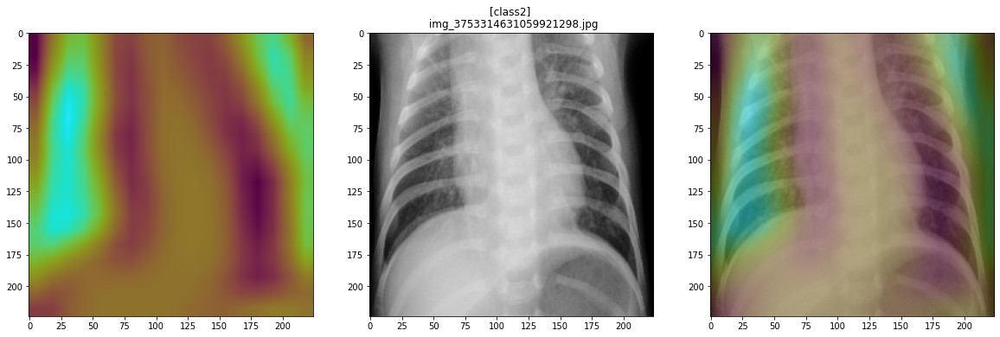

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam1.png', bbox_inches='tight', dpi=300);

In [ ]:
# PREDICTION ON A BACTERIAL PNEUMONIA X-RAY
img_path = img_class1

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 30ms/step


In [ ]:
icam = GradCAM(model, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


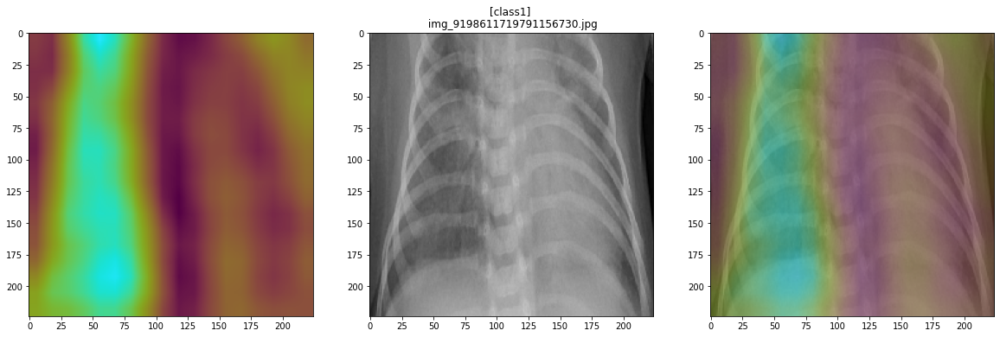

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam2.png', bbox_inches='tight', dpi=300);

In [ ]:
# PREDICTION ON A NORMAL X-RAY
img_path = img_class0

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = model.predict(image) 
i = round(preds[0][0])

1/1 [==============================] - 0s 22ms/step


In [ ]:
icam = GradCAM(model, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


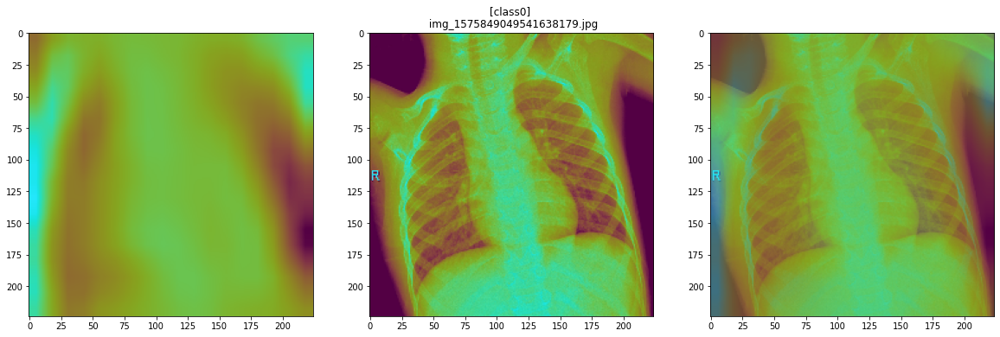

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam3.png', bbox_inches='tight', dpi=300);

___________________________________________________________________________________________________________
______________________________________________________________________________________________________________
____________________________________________________________________________________________________________

**Red preentrenada VGG16**

extraccion de caracteristicas con aumento de datos

In [ ]:
from tensorflow.keras.applications import VGG16
conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

58889256/58889256 [==============================] - 2s 0us/step


In [ ]:
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))

In [ ]:
print('This is the number of trainable weights '
'before freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights before freezing the conv base: 30


In [ ]:
conv_base.trainable = False
print('This is the number of trainable weights '
'after freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights after freezing the conv base: 4


In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
    validation_images,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

Found 3730 images belonging to 3 classes.
Found 912 images belonging to 3 classes.


In [ ]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator)

Epoch 1/30
117/117 [==============================] - 1733s 15s/step - loss: 1.1881 - accuracy: 0.5812 - val_loss: 0.7462 - val_accuracy: 0.6886
Epoch 2/30
117/117 [==============================] - 140s 1s/step - loss: 0.7565 - accuracy: 0.6716 - val_loss: 0.6123 - val_accuracy: 0.7259
Epoch 3/30
117/117 [==============================] - 138s 1s/step - loss: 0.6880 - accuracy: 0.7035 - val_loss: 0.5548 - val_accuracy: 0.7862
Epoch 4/30
117/117 [==============================] - 141s 1s/step - loss: 0.6525 - accuracy: 0.7212 - val_loss: 0.7400 - val_accuracy: 0.6787
Epoch 5/30
117/117 [==============================] - 137s 1s/step - loss: 0.6088 - accuracy: 0.7349 - val_loss: 0.8711 - val_accuracy: 0.6601
Epoch 6/30
117/117 [==============================] - 139s 1s/step - loss: 0.6181 - accuracy: 0.7402 - val_loss: 0.5469 - val_accuracy: 0.7884
Epoch 7/30
117/117 [==============================] - 137s 1s/step - loss: 0.5908 - accuracy: 0.7515 - val_loss: 0.5200 - val_accuracy: 0.79

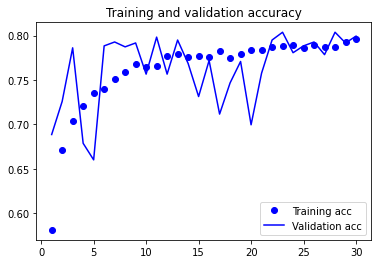

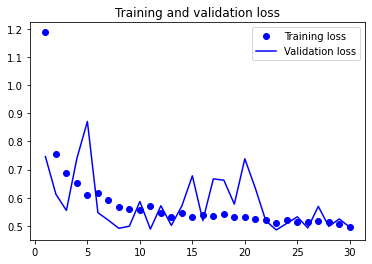

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

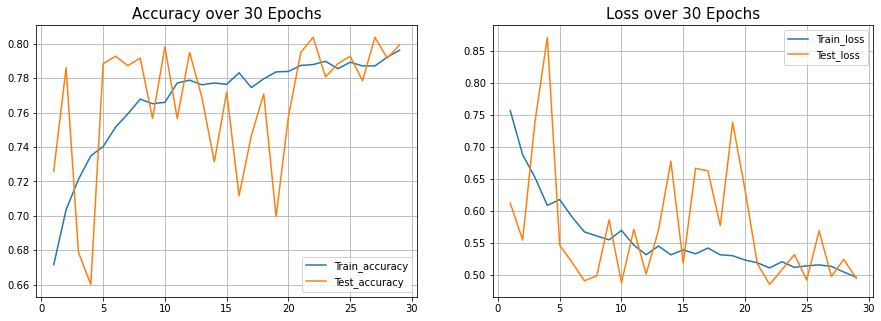

In [ ]:
epoch=30
def plot_acc_loss(result, epochs):
 acc = result.history["accuracy"]
 loss = result.history["loss"]
 val_acc = result.history["val_accuracy"]
 val_loss = result.history["val_loss"]
 plt.figure(figsize=(15, 5))
 plt.subplot(121)
 plt.plot(range(1,epochs), acc[1:], label="Train_accuracy")
 plt.plot(range(1,epochs), val_acc[1:], label="Test_accuracy")
 plt.title("Accuracy over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.subplot(122)
 plt.plot(range(1,epochs), loss[1:], label="Train_loss")
 plt.plot(range(1,epochs), val_loss[1:], label="Test_loss")
 plt.title("Loss over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.show()
 
plot_acc_loss(history, 30)

Ajuste fino congelando las capas excepto la ultima

In [ ]:
conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False

In [ ]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator)

Epoch 1/40
117/117 [==============================] - 140s 1s/step - loss: 2.6359 - accuracy: 0.5909 - val_loss: 0.6882 - val_accuracy: 0.6886
Epoch 2/40
117/117 [==============================] - 136s 1s/step - loss: 0.7540 - accuracy: 0.6611 - val_loss: 0.7153 - val_accuracy: 0.6996
Epoch 3/40
117/117 [==============================] - 138s 1s/step - loss: 0.7076 - accuracy: 0.7072 - val_loss: 0.8893 - val_accuracy: 0.6590
Epoch 4/40
117/117 [==============================] - 139s 1s/step - loss: 0.6571 - accuracy: 0.7174 - val_loss: 0.5969 - val_accuracy: 0.7599
Epoch 5/40
117/117 [==============================] - 138s 1s/step - loss: 0.6419 - accuracy: 0.7236 - val_loss: 0.5132 - val_accuracy: 0.7906
Epoch 6/40
117/117 [==============================] - 137s 1s/step - loss: 0.6220 - accuracy: 0.7456 - val_loss: 0.9403 - val_accuracy: 0.6721
Epoch 7/40
117/117 [==============================] - 137s 1s/step - loss: 0.5952 - accuracy: 0.7528 - val_loss: 0.4992 - val_accuracy: 0.7961

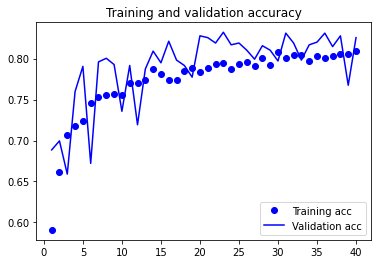

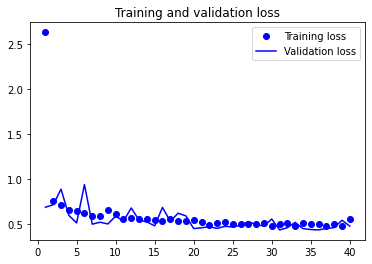

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

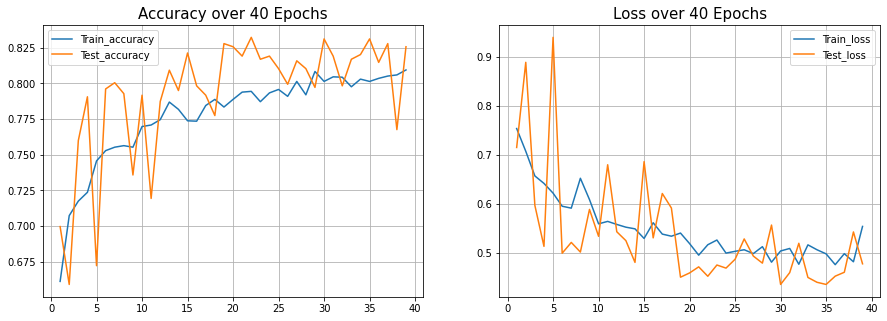

In [ ]:
def plot_acc_loss(result, epochs):
 acc = result.history["accuracy"]
 loss = result.history["loss"]
 val_acc = result.history["val_accuracy"]
 val_loss = result.history["val_loss"]
 plt.figure(figsize=(15, 5))
 plt.subplot(121)
 plt.plot(range(1,epochs), acc[1:], label="Train_accuracy")
 plt.plot(range(1,epochs), val_acc[1:], label="Test_accuracy")
 plt.title("Accuracy over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.subplot(122)
 plt.plot(range(1,epochs), loss[1:], label="Train_loss")
 plt.plot(range(1,epochs), val_loss[1:], label="Test_loss")
 plt.title("Loss over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.show()
 
plot_acc_loss(history, 40)

In [ ]:
model.save("/content/drive/MyDrive/chest_x_ray/modelvgg16_2.h")
model.save_weights("/content/drive/MyDrive/chest_x_ray/pesosvgg16_2.h")

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 30 images belonging to 3 classes.


<ipython-input-22-dc5568437911>:7: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)


test acc: 0.8333333134651184


In [ ]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
test_generator = test_datagen.flow_from_directory(
 test_dir,
 target_size=(224,224),
 batch_size=32,
 shuffle=False,
 seed=42,
 class_mode="categorical")

test_generator.reset()
x = model.evaluate_generator(test_generator,
                             steps = np.ceil(len(test_generator) / 32),
                             use_multiprocessing = False,
                             verbose = 1,
                             workers=1)
print("Test loss:" , x[0])
print("Test accuracy:",x[1])

Found 30 images belonging to 3 classes.


<ipython-input-23-5e74875c24d8>:11: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  x = model.evaluate_generator(test_generator,


1/1 [==============================] - 1s 714ms/step - loss: 0.3876 - accuracy: 0.8333
Test loss: 0.38762104511260986
Test accuracy: 0.8333333134651184


**Predict**

In [51]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelvgg16_2.h")

In [52]:
from sklearn.metrics import classification_report
BS = 8
print("[INFO] evaluating network...")
predIdxs = model.predict(dataset, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(label1.argmax(axis=1), predIdxs,digits=4))

[INFO] evaluating network...
4/4 [==============================] - 3s 482ms/step
              precision    recall  f1-score   support

           0     0.9091    1.0000    0.9524        10
           1     0.7143    1.0000    0.8333        10
           2     1.0000    0.5000    0.6667        10

    accuracy                         0.8333        30
   macro avg     0.8745    0.8333    0.8175        30
weighted avg     0.8745    0.8333    0.8175        30



acc: 0.6667
sensitivity: 1.0000
specificity: 1.0000


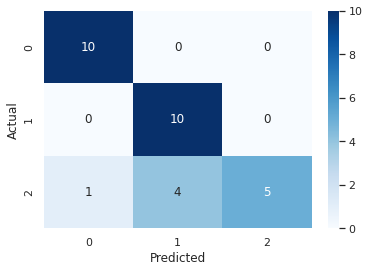

<Figure size 1152x864 with 0 Axes>

In [53]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(label1.argmax(axis=1), predIdxs)
sns.set(font_scale=1)#for label size
sns.heatmap(cm, cmap="Blues", annot=True,annot_kws={"size": 12})# font siz
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.figure(figsize = (16,12))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

1/1 [==============================] - 0s 67ms/step
Total-test-data; 30 	accurately-predicted-data: 25 	 wrongly-predicted-data:  5
Accuracy: 83.333 %


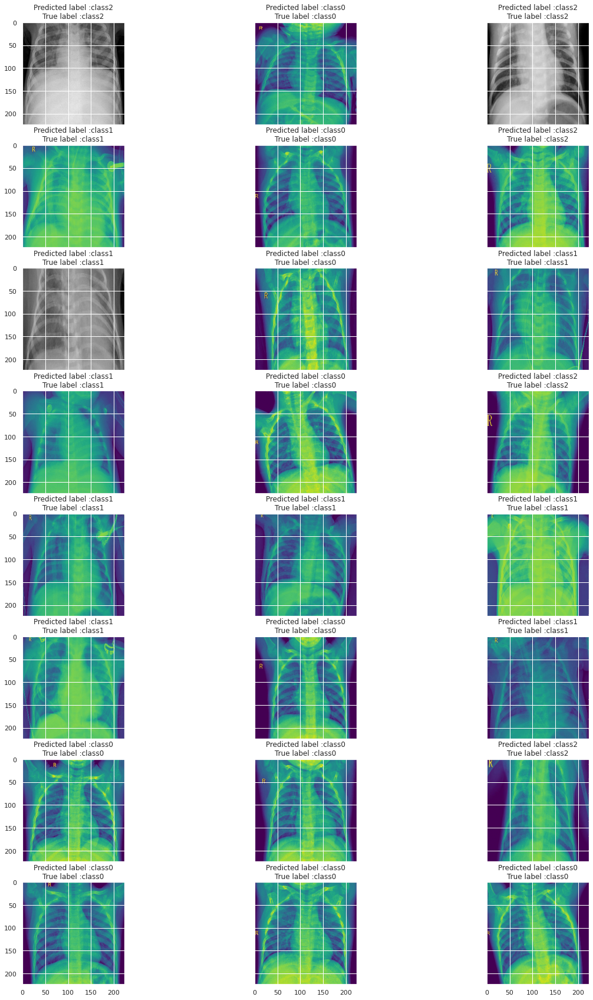

In [55]:
import random
ypred = model.predict(dataset)
total = 0
accurate = 0
accurateindex = []
wrongindex = []

for i in range(len(ypred)):
    if np.argmax(ypred[i]) == np.argmax(label1[i]):
        accurate += 1
        accurateindex.append(i)
    else:
        wrongindex.append(i)
        
    total += 1
    
print('Total-test-data;', total, '\taccurately-predicted-data:', accurate, '\t wrongly-predicted-data: ', total - accurate)
print('Accuracy:', round(accurate/total*100, 3), '%')
label= {0: 'class0', 1: 'class1', 2: 'class2'}
imidx = random.sample(accurateindex, k=24)# replace with 'wrongindex'

nrows = 8
ncols = 3
fig, ax = plt.subplots(nrows,ncols,sharex=True,sharey=True,figsize=(20, 30))

n = 0
for row in range(nrows):
    for col in range(ncols):
            ax[row,col].imshow(dataset[imidx[n]])
            ax[row,col].set_title("Predicted label :{}\nTrue label :{}".format(label[np.argmax(ypred[imidx[n]])], label[np.argmax(label1[imidx[n]])]))
            n += 1

plt.show()

**Heat Map**

In [ ]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelmobilenetv2_1.h")


In [ ]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelvgg16_2.h")


In [ ]:
for idx in range(len(model.layers)):
  print(model.get_layer(index = idx).name)

mobilenetv2_1.00_224
flatten
dense
dense_1


In [ ]:
img_class0 ='/content/drive/MyDrive/chest_x_ray/test/class0/img_1575849049541638179.jpg'
img_class1 ='/content/drive/MyDrive/chest_x_ray/test/class1/img_9198611719791156730.jpg'
img_class2 ='/content/drive/MyDrive/chest_x_ray/test/class2/img_3753314631059921298.jpg'

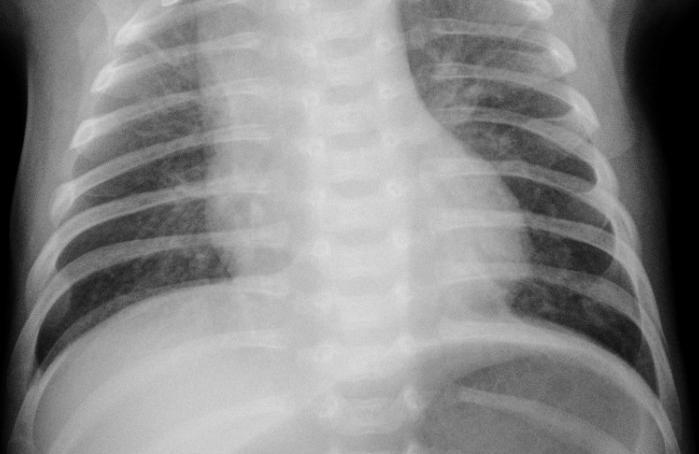

In [ ]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
img_size = (224, 224)




# The local path to our target image
img_path = img_class2
display(Image(img_path))

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
last_conv_layer_name = model.get_output_at(0)


RuntimeError: ignored

In [ ]:
img_array = preprocess_input(get_img_array(img_path, size=img_size))


# Remove last layer's softmax
model.layers[-1].activation = None



# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

ValueError: ignored

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

ValueError: ignored

_________________________________________________________________________________________________________________________
___________________________________________________________________________________________________________________________
____________________________________________________________________________________________________________________________

**Mobil net v2**

In [24]:
from tensorflow.keras.applications import MobileNetV2
conv_base1 = MobileNetV2(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
conv_base1.summary()

In [ ]:
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))

In [ ]:
print('This is the number of trainable weights '
'before freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights before freezing the conv base: 160


In [ ]:
conv_base.trainable = False
print('This is the number of trainable weights '
'after freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights after freezing the conv base: 4


In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
    validation_images,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

Found 3730 images belonging to 3 classes.
Found 912 images belonging to 3 classes.


In [ ]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator)
    

Epoch 1/40
117/117 [==============================] - 2937s 25s/step - loss: 4.8276 - accuracy: 0.6169 - val_loss: 0.9487 - val_accuracy: 0.7906
Epoch 2/40
117/117 [==============================] - 132s 1s/step - loss: 1.3817 - accuracy: 0.6826 - val_loss: 3.2603 - val_accuracy: 0.5066
Epoch 3/40
117/117 [==============================] - 133s 1s/step - loss: 1.0189 - accuracy: 0.6949 - val_loss: 0.6112 - val_accuracy: 0.7851
Epoch 4/40
117/117 [==============================] - 130s 1s/step - loss: 0.7040 - accuracy: 0.7354 - val_loss: 0.5635 - val_accuracy: 0.7599
Epoch 5/40
117/117 [==============================] - 132s 1s/step - loss: 0.6179 - accuracy: 0.7504 - val_loss: 0.5353 - val_accuracy: 0.7873
Epoch 6/40
117/117 [==============================] - 132s 1s/step - loss: 0.5787 - accuracy: 0.7708 - val_loss: 0.6009 - val_accuracy: 0.7982
Epoch 7/40
117/117 [==============================] - 130s 1s/step - loss: 0.5705 - accuracy: 0.7697 - val_loss: 0.4900 - val_accuracy: 0.79

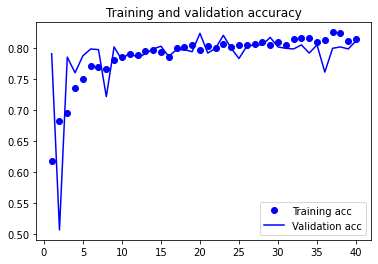

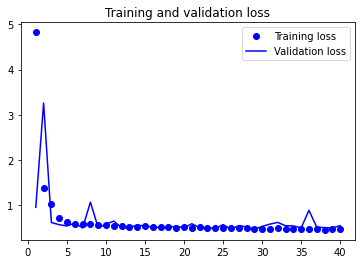

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

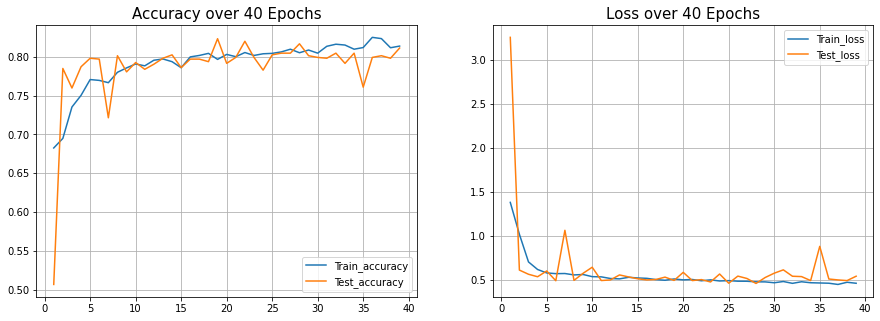

In [ ]:
def plot_acc_loss(result, epochs):
 acc = result.history["accuracy"]
 loss = result.history["loss"]
 val_acc = result.history["val_accuracy"]
 val_loss = result.history["val_loss"]
 plt.figure(figsize=(15, 5))
 plt.subplot(121)
 plt.plot(range(1,epochs), acc[1:], label="Train_accuracy")
 plt.plot(range(1,epochs), val_acc[1:], label="Test_accuracy")
 plt.title("Accuracy over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.subplot(122)
 plt.plot(range(1,epochs), loss[1:], label="Train_loss")
 plt.plot(range(1,epochs), val_loss[1:], label="Test_loss")
 plt.title("Loss over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.show()
 
plot_acc_loss(history, 40)

In [ ]:
model.save("/content/drive/MyDrive/chest_x_ray/modelmobilenetv2_1.h")
model.save_weights("/content/drive/MyDrive/chest_x_ray/pesosmobilenetv2_1.h")

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 30 images belonging to 3 classes.


<ipython-input-18-dc5568437911>:7: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)


test acc: 0.800000011920929


In [ ]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
test_generator = test_datagen.flow_from_directory(
 test_dir,
 target_size=(224,224),
 batch_size=32,
 shuffle=False,
 seed=42,
 class_mode="categorical")

test_generator.reset()
x = model.evaluate_generator(test_generator,
                             steps = np.ceil(len(test_generator) / 32),
                             use_multiprocessing = False,
                             verbose = 1,
                             workers=1)
print("Test loss:" , x[0])
print("Test accuracy:",x[1])

Found 30 images belonging to 3 classes.


<ipython-input-19-5e74875c24d8>:11: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  x = model.evaluate_generator(test_generator,


1/1 [==============================] - 1s 626ms/step - loss: 0.4317 - accuracy: 0.8000
Test loss: 0.43171703815460205
Test accuracy: 0.800000011920929


In [ ]:
conv_base.summary()

In [ ]:
conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block_16':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False

In [ ]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator)

Epoch 1/40
117/117 [==============================] - 139s 1s/step - loss: 0.4558 - accuracy: 0.8225 - val_loss: 0.4981 - val_accuracy: 0.8070
Epoch 2/40
117/117 [==============================] - 134s 1s/step - loss: 0.4567 - accuracy: 0.8196 - val_loss: 0.4941 - val_accuracy: 0.8114
Epoch 3/40
117/117 [==============================] - 134s 1s/step - loss: 0.4562 - accuracy: 0.8139 - val_loss: 0.4806 - val_accuracy: 0.8048
Epoch 4/40
117/117 [==============================] - 133s 1s/step - loss: 0.4649 - accuracy: 0.8182 - val_loss: 0.4961 - val_accuracy: 0.8103
Epoch 5/40
117/117 [==============================] - 134s 1s/step - loss: 0.4588 - accuracy: 0.8158 - val_loss: 0.4643 - val_accuracy: 0.8202
Epoch 6/40
117/117 [==============================] - 135s 1s/step - loss: 0.4488 - accuracy: 0.8257 - val_loss: 0.4925 - val_accuracy: 0.8180
Epoch 7/40
117/117 [==============================] - 132s 1s/step - loss: 0.4704 - accuracy: 0.8185 - val_loss: 0.4463 - val_accuracy: 0.8103

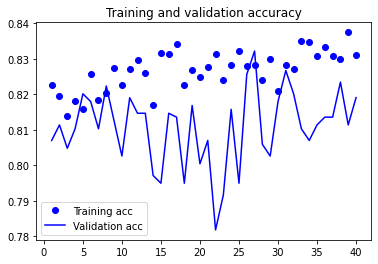

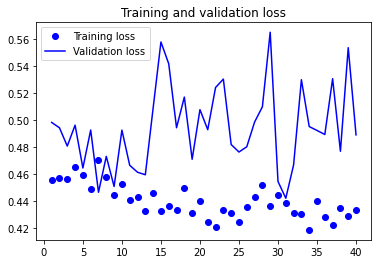

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

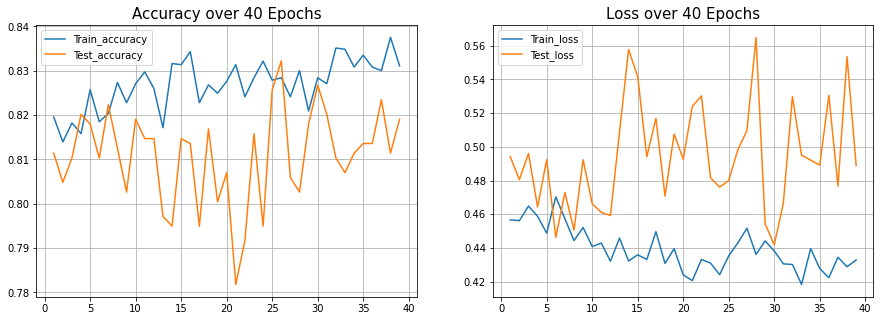

In [ ]:
def plot_acc_loss(result, epochs):
 acc = result.history["accuracy"]
 loss = result.history["loss"]
 val_acc = result.history["val_accuracy"]
 val_loss = result.history["val_loss"]
 plt.figure(figsize=(15, 5))
 plt.subplot(121)
 plt.plot(range(1,epochs), acc[1:], label="Train_accuracy")
 plt.plot(range(1,epochs), val_acc[1:], label="Test_accuracy")
 plt.title("Accuracy over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.subplot(122)
 plt.plot(range(1,epochs), loss[1:], label="Train_loss")
 plt.plot(range(1,epochs), val_loss[1:], label="Test_loss")
 plt.title("Loss over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.show()
 
plot_acc_loss(history, 40)

In [ ]:
model.save("/content/drive/MyDrive/chest_x_ray/modelmobilenetv2_2.h")
model.save_weights("/content/drive/MyDrive/chest_x_ray/pesosmobilenetv2_2.h")

In [ ]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
test_generator = test_datagen.flow_from_directory(
 test_dir,
 target_size=(224,224),
 batch_size=32,
 shuffle=False,
 seed=42,
 class_mode="categorical")

test_generator.reset()
x = model.evaluate_generator(test_generator,
                             steps = np.ceil(len(test_generator) / 32),
                             use_multiprocessing = False,
                             verbose = 1,
                             workers=1)
print("Test loss:" , x[0])
print("Test accuracy:",x[1])

Found 30 images belonging to 3 classes.


<ipython-input-27-5e74875c24d8>:11: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  x = model.evaluate_generator(test_generator,


1/1 [==============================] - 1s 954ms/step - loss: 0.3502 - accuracy: 0.8667
Test loss: 0.3502359092235565
Test accuracy: 0.8666666746139526


**Pred**

In [56]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelmobilenetv2_2.h")

In [57]:
from sklearn.metrics import classification_report
BS = 8
print("[INFO] evaluating network...")
predIdxs = model.predict(dataset, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(label1.argmax(axis=1), predIdxs,digits=4))

[INFO] evaluating network...
4/4 [==============================] - 2s 150ms/step
              precision    recall  f1-score   support

           0     1.0000    0.9000    0.9474        10
           1     0.6667    0.8000    0.7273        10
           2     0.7778    0.7000    0.7368        10

    accuracy                         0.8000        30
   macro avg     0.8148    0.8000    0.8038        30
weighted avg     0.8148    0.8000    0.8038        30



acc: 0.5667
sensitivity: 0.9000
specificity: 1.0000


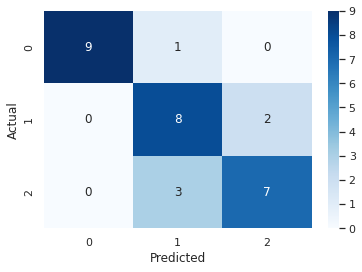

<Figure size 1152x864 with 0 Axes>

In [58]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(label1.argmax(axis=1), predIdxs)
sns.set(font_scale=1)#for label size
sns.heatmap(cm, cmap="Blues", annot=True,annot_kws={"size": 12})# font siz
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.figure(figsize = (16,12))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

1/1 [==============================] - 1s 506ms/step
Total-test-data; 30 	accurately-predicted-data: 24 	 wrongly-predicted-data:  6
Accuracy: 80.0 %


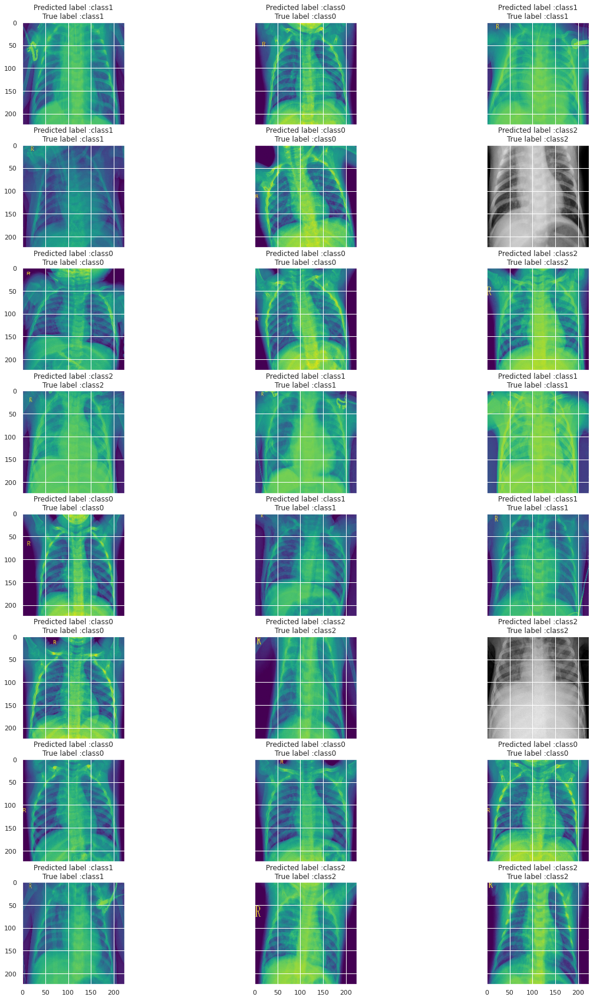

In [59]:
import random
ypred = model.predict(dataset)
total = 0
accurate = 0
accurateindex = []
wrongindex = []

for i in range(len(ypred)):
    if np.argmax(ypred[i]) == np.argmax(label1[i]):
        accurate += 1
        accurateindex.append(i)
    else:
        wrongindex.append(i)
        
    total += 1
    
print('Total-test-data;', total, '\taccurately-predicted-data:', accurate, '\t wrongly-predicted-data: ', total - accurate)
print('Accuracy:', round(accurate/total*100, 3), '%')
label= {0: 'class0', 1: 'class1', 2: 'class2'}
imidx = random.sample(accurateindex, k=24)# replace with 'wrongindex'

nrows = 8
ncols = 3
fig, ax = plt.subplots(nrows,ncols,sharex=True,sharey=True,figsize=(20, 30))

n = 0
for row in range(nrows):
    for col in range(ncols):
            ax[row,col].imshow(dataset[imidx[n]])
            ax[row,col].set_title("Predicted label :{}\nTrue label :{}".format(label[np.argmax(ypred[imidx[n]])], label[np.argmax(label1[imidx[n]])]))
            n += 1

plt.show()

__________________________________________________________________________________________________________________
__________________________________________________________________________________________________________________
__________________________________________________________________________________________________________________

In [ ]:
conv_base.summary()

In [ ]:
from keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet')

553467096/553467096 [==============================] - 18s 0us/step


In [ ]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelmobilenetv2_2.h")

In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input, decode_predictions
import numpy as np
from tensorflow.keras import utils
img_path ='/content/drive/MyDrive/chest_x_ray/test/class0/img_1575849049541638179.jpg'
img = utils.load_img(img_path, target_size=(224, 224))
x = utils.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

In [ ]:
# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [ ]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelmobilenetv2_2.h")

___________________________________________________________________________________________________________________
___________________________________________________________________________________________________________________
__________________________________________________________________________________________________________________

**ResNet50V2**

In [16]:
from tensorflow.keras.applications import ResNet50V2
conv_base = ResNet50V2(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

In [17]:
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))

In [18]:
print('This is the number of trainable weights '
'before freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights before freezing the conv base: 176


In [19]:
conv_base.trainable = False
print('This is the number of trainable weights '
'after freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights after freezing the conv base: 4


In [20]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
    validation_images,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

Found 3730 images belonging to 3 classes.
Found 912 images belonging to 3 classes.


In [21]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator)

Epoch 1/40
117/117 [==============================] - 2286s 19s/step - loss: 2.8211 - accuracy: 0.6367 - val_loss: 0.6897 - val_accuracy: 0.7182
Epoch 2/40
117/117 [==============================] - 142s 1s/step - loss: 0.7544 - accuracy: 0.7113 - val_loss: 0.6262 - val_accuracy: 0.7577
Epoch 3/40
117/117 [==============================] - 141s 1s/step - loss: 0.6495 - accuracy: 0.7354 - val_loss: 0.6266 - val_accuracy: 0.7664
Epoch 4/40
117/117 [==============================] - 163s 1s/step - loss: 0.5977 - accuracy: 0.7579 - val_loss: 0.5706 - val_accuracy: 0.7851
Epoch 5/40
117/117 [==============================] - 141s 1s/step - loss: 0.6004 - accuracy: 0.7592 - val_loss: 0.6832 - val_accuracy: 0.7489
Epoch 6/40
117/117 [==============================] - 142s 1s/step - loss: 0.5852 - accuracy: 0.7756 - val_loss: 0.5728 - val_accuracy: 0.7884
Epoch 7/40
117/117 [==============================] - 162s 1s/step - loss: 0.5750 - accuracy: 0.7641 - val_loss: 0.5271 - val_accuracy: 0.79

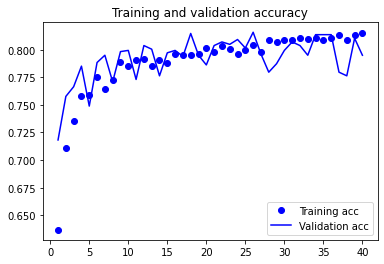

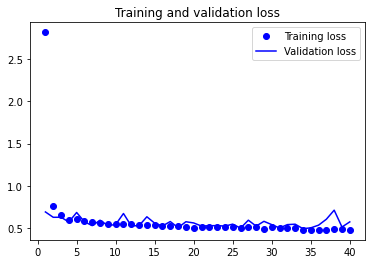

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

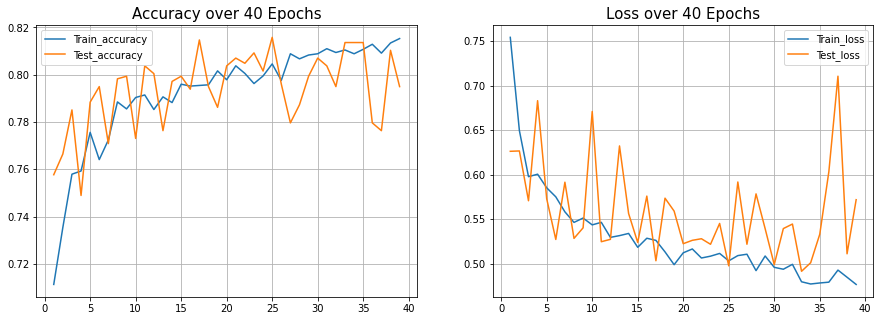

In [ ]:
def plot_acc_loss(result, epochs):
 acc = result.history["accuracy"]
 loss = result.history["loss"]
 val_acc = result.history["val_accuracy"]
 val_loss = result.history["val_loss"]
 plt.figure(figsize=(15, 5))
 plt.subplot(121)
 plt.plot(range(1,epochs), acc[1:], label="Train_accuracy")
 plt.plot(range(1,epochs), val_acc[1:], label="Test_accuracy")
 plt.title("Accuracy over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.subplot(122)
 plt.plot(range(1,epochs), loss[1:], label="Train_loss")
 plt.plot(range(1,epochs), val_loss[1:], label="Test_loss")
 plt.title("Loss over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.show()
 
plot_acc_loss(history, 40)

In [ ]:
model.save("/content/drive/MyDrive/chest_x_ray/modelresnet50v2_1.h")
model.save_weights("/content/drive/MyDrive/chest_x_ray/pesosresnetv2_1.h")

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 30 images belonging to 3 classes.


<ipython-input-16-dc5568437911>:7: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)


test acc: 0.7333333492279053


In [ ]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
test_generator = test_datagen.flow_from_directory(
 test_dir,
 target_size=(224,224),
 batch_size=32,
 shuffle=False,
 seed=42,
 class_mode="categorical")

test_generator.reset()
x = model.evaluate_generator(test_generator,
                             steps = np.ceil(len(test_generator) / 32),
                             use_multiprocessing = False,
                             verbose = 1,
                             workers=1)
print("Test loss:" , x[0])
print("Test accuracy:",x[1])

Found 30 images belonging to 3 classes.


<ipython-input-17-5e74875c24d8>:11: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  x = model.evaluate_generator(test_generator,


1/1 [==============================] - 1s 680ms/step - loss: 0.4847 - accuracy: 0.7333
Test loss: 0.4847259521484375
Test accuracy: 0.7333333492279053


In [12]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelresnet50v2_1.h")


**Ajuste fino**

In [ ]:
conv_base.summary()

In [30]:
conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'conv5_block3':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False

In [31]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [32]:
history = model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator)

Epoch 1/40
117/117 [==============================] - 3693s 32s/step - loss: 3.8836 - accuracy: 0.6204 - val_loss: 0.8072 - val_accuracy: 0.7423
Epoch 2/40
117/117 [==============================] - 136s 1s/step - loss: 1.1328 - accuracy: 0.6914 - val_loss: 0.6724 - val_accuracy: 0.7697
Epoch 3/40
117/117 [==============================] - 137s 1s/step - loss: 0.8978 - accuracy: 0.7153 - val_loss: 0.8445 - val_accuracy: 0.7072
Epoch 4/40
117/117 [==============================] - 137s 1s/step - loss: 0.6532 - accuracy: 0.7504 - val_loss: 0.5119 - val_accuracy: 0.7917
Epoch 5/40
117/117 [==============================] - 137s 1s/step - loss: 0.6431 - accuracy: 0.7445 - val_loss: 0.5334 - val_accuracy: 0.7818
Epoch 6/40
117/117 [==============================] - 140s 1s/step - loss: 0.6016 - accuracy: 0.7657 - val_loss: 0.5684 - val_accuracy: 0.7621
Epoch 7/40
117/117 [==============================] - 157s 1s/step - loss: 0.5732 - accuracy: 0.7697 - val_loss: 0.5176 - val_accuracy: 0.79

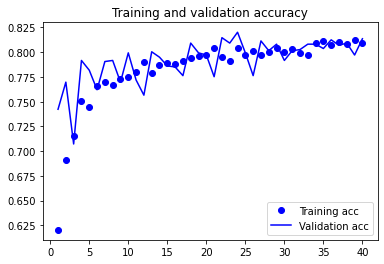

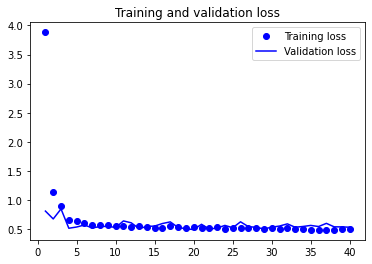

In [33]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

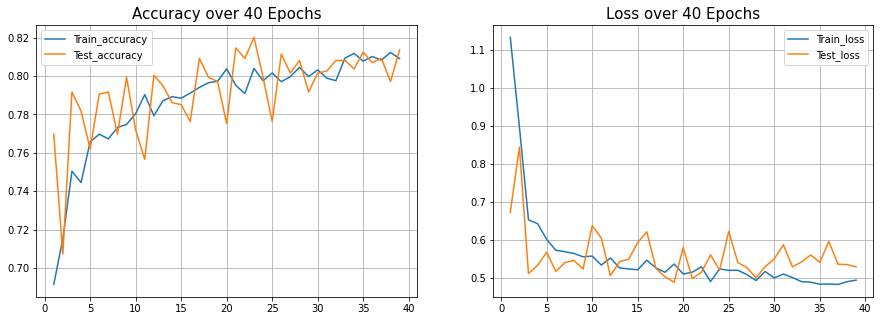

In [34]:
def plot_acc_loss(result, epochs):
 acc = result.history["accuracy"]
 loss = result.history["loss"]
 val_acc = result.history["val_accuracy"]
 val_loss = result.history["val_loss"]
 plt.figure(figsize=(15, 5))
 plt.subplot(121)
 plt.plot(range(1,epochs), acc[1:], label="Train_accuracy")
 plt.plot(range(1,epochs), val_acc[1:], label="Test_accuracy")
 plt.title("Accuracy over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.subplot(122)
 plt.plot(range(1,epochs), loss[1:], label="Train_loss")
 plt.plot(range(1,epochs), val_loss[1:], label="Test_loss")
 plt.title("Loss over " + str(epochs) + " Epochs", size=15)
 plt.legend()
 plt.grid(True)
 plt.show()
 
plot_acc_loss(history, 40)

In [35]:
model.save("/content/drive/MyDrive/chest_x_ray/modelresnet50v2_2.h")
model.save_weights("/content/drive/MyDrive/chest_x_ray/pesosresnetv2_2.h")

In [36]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 30 images belonging to 3 classes.


<ipython-input-36-dc5568437911>:7: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)


test acc: 0.7333333492279053


In [37]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
test_generator = test_datagen.flow_from_directory(
 test_dir,
 target_size=(224,224),
 batch_size=32,
 shuffle=False,
 seed=42,
 class_mode="categorical")

test_generator.reset()
x = model.evaluate_generator(test_generator,
                             steps = np.ceil(len(test_generator) / 32),
                             use_multiprocessing = False,
                             verbose = 1,
                             workers=1)
print("Test loss:" , x[0])
print("Test accuracy:",x[1])

Found 30 images belonging to 3 classes.


<ipython-input-37-5e74875c24d8>:11: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  x = model.evaluate_generator(test_generator,


1/1 [==============================] - 1s 669ms/step - loss: 0.4232 - accuracy: 0.7333
Test loss: 0.42315563559532166
Test accuracy: 0.7333333492279053


In [38]:
class0 = '/content/drive/MyDrive/chest_x_ray/test/class0'
class1 = '/content/drive/MyDrive/chest_x_ray/test/class1'
class2 = '/content/drive/MyDrive/chest_x_ray/test/class2'

In [39]:
import cv2
from imutils import paths
imagePaths = list(paths.list_images(class0))
data = []
labels = []
for imagePath in imagePaths:
    label = 0
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    # update the data and labels lists, respectively
    data.append(image)
    labels.append(label)
data = np.array(data) /255
labels = np.array(labels)

imagePaths1 = list(paths.list_images(class1))
data1 = []
labels1 = []
for imagePath in imagePaths1:
    label1 = 1
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data1.append(image)
    labels1.append(label1)

data1 = np.array(data1) / 255
labels1 = np.array(labels1)

imagePaths2 = list(paths.list_images(class2))
data2 = []
labels2 = []
for imagePath in imagePaths2:
    label2 = 2
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data2.append(image)
    labels2.append(label2)
data2 = np.array(data2) / 255
labels2 = np.array(labels2)

dataset = np.concatenate((data, data1, data2), axis=0)
label = np.concatenate((labels, labels1, labels2), axis=0)

label2 = to_categorical(label)

label1 = to_categorical(label)

In [40]:
from sklearn.metrics import classification_report
BS = 8
print("[INFO] evaluating network...")
predIdxs = model.predict(dataset, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(label1.argmax(axis=1), predIdxs,digits=4))

[INFO] evaluating network...
4/4 [==============================] - 3s 238ms/step
              precision    recall  f1-score   support

           0     0.9000    0.9000    0.9000        10
           1     0.5625    0.9000    0.6923        10
           2     0.7500    0.3000    0.4286        10

    accuracy                         0.7000        30
   macro avg     0.7375    0.7000    0.6736        30
weighted avg     0.7375    0.7000    0.6736        30



acc: 0.6000
sensitivity: 0.9000
specificity: 1.0000


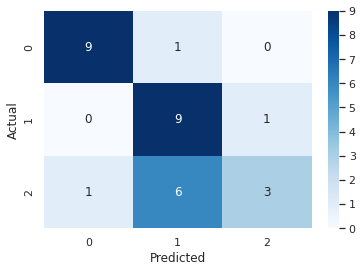

<Figure size 1152x864 with 0 Axes>

In [41]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(label1.argmax(axis=1), predIdxs)
sns.set(font_scale=1)#for label size
sns.heatmap(cm, cmap="Blues", annot=True,annot_kws={"size": 12})# font siz
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.figure(figsize = (16,12))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

1/1 [==============================] - 0s 117ms/step
Total-test-data; 30 	accurately-predicted-data: 21 	 wrongly-predicted-data:  9
Accuracy: 70.0 %


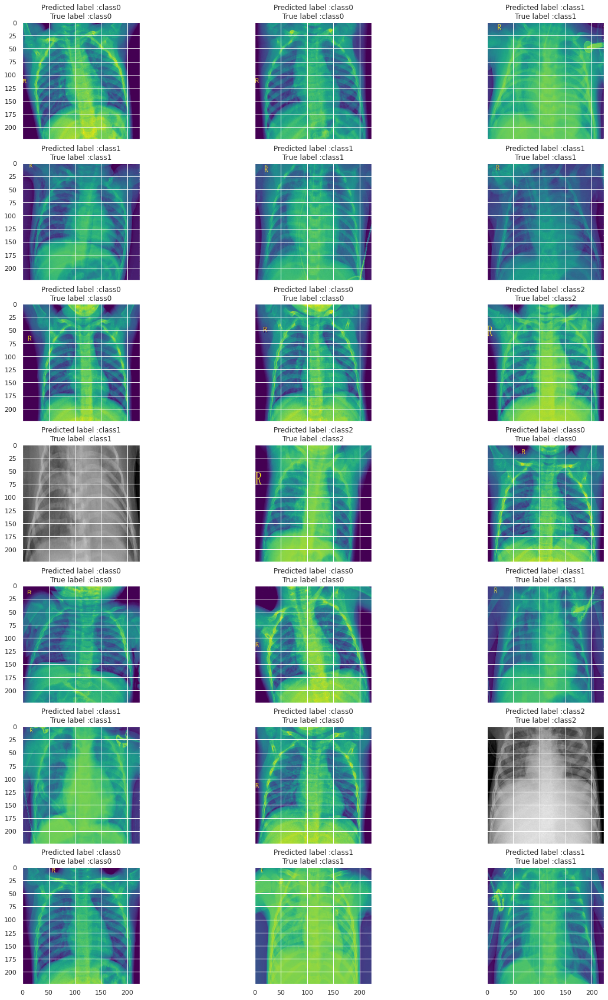

In [43]:
import random
ypred = model.predict(dataset)
total = 0
accurate = 0
accurateindex = []
wrongindex = []

for i in range(len(ypred)):
    if np.argmax(ypred[i]) == np.argmax(label1[i]):
        accurate += 1
        accurateindex.append(i)
    else:
        wrongindex.append(i)
        
    total += 1
    
print('Total-test-data;', total, '\taccurately-predicted-data:', accurate, '\t wrongly-predicted-data: ', total - accurate)
print('Accuracy:', round(accurate/total*100, 3), '%')
label= {0: 'class0', 1: 'class1', 2: 'class2'}
imidx = random.sample(accurateindex, k=21)# replace with 'wrongindex'

nrows = 7
ncols = 3
fig, ax = plt.subplots(nrows,ncols,sharex=True,sharey=True,figsize=(20, 30))

n = 0
for row in range(nrows):
    for col in range(ncols):
            ax[row,col].imshow(dataset[imidx[n]])
            ax[row,col].set_title("Predicted label :{}\nTrue label :{}".format(label[np.argmax(ypred[imidx[n]])], label[np.argmax(label1[imidx[n]])]))
            n += 1

plt.show()

__________________________________________________________________________________________________________________
___________________________________________________________________________________________________________________
___________________________________________________________________________________________________________________
__________________________________________________________________________________________________________________

In [ ]:
from argparse import ArgumentParser

import cv2
import imutils
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, imagenet_utils
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
class GradCAM(object):
    """
    Implementa un modelo Grad-CAM usado para debuggear visualmente las activaciones
    de una CNN.
    """

    def __init__(self, model, class_index, layer_name=None):
        """
        Constructor del modelo Grad-CAM.
        :param model: Red que examinaremos.
        :param class_index: Índice de la clase que examinaremos.
        :param layer_name: Nombre de la última capa convolucional de `model`. Este parámetro es opcional;
                           si no se provee, el constructor tratará de hallar la última capa convolucional de forma
                           automática, al quedarse con la última capa de 4 dimensiones que encuentre.
        """
        self.class_index = class_index

        # Si no se proporcionó el nombre de la última capa, nos quedamos con la última capa
        # de 4 dimensiones.
        if layer_name is None:
            for layer in reversed(model.layers):
                if len(layer.output_shape) == 4:
                    layer_name = layer.name
                    break
                    
        # Creamos el modelo Grad-CAM como tal.
        self.grad_model = self._create_grad_model(model, layer_name)

In [ ]:
    def _create_grad_model(self, model, layer_name):
        """
        Crea el modelo Grad-CAM, que no es más que una copia de la red original, que aparte de producir
        las predicciones esperadas, también retorna las activaciones de la capa a examinar (indicada por
        layer_name).
        :param model: Modelo a examinar.
        :param layer_name: Nombre de la capa cuyas activaciones examinaremos.
        """
        return Model(inputs=[model.inputs],
                     outputs=[model.get_layer(layer_name).output, model.output])

In [ ]:
    def compute_heatmap(self, image, epsilon=1e-8):
        """
        Produce el mapa de calor correspondiente a las activaciones del modelo cuando se le pasa una imagen.
        :param image: Imagen que usaremos para examinar las activaciones del modelo.
        :param epsilon: Valor muy pequeño para evitar una división por cero.
        :return: Mapa de calor.
        """
        # Pasamos la imagen de entrada por el modelo, y extraemos el valor de la pérdida.
        with tf.GradientTape() as tape:
            inputs = tf.cast(image, tf.float32)
            conv_outputs, preds = self.grad_model(inputs)

            # Extraemos la pérdida específica a la clase que estamos debuggeando.
            loss = preds[:, self.class_index]
            grads = tape.gradient(loss, conv_outputs)
            guided_grads = (tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads)
            conv_outputs = conv_outputs[0]
            guided_grads = guided_grads[0]
            weights = tf.reduce_mean(guided_grads, axis=(0, 1))
            cam = tf.reduce_sum(tf.multiply(weights, conv_outputs), axis=-1)
            min = heatmap.min()
            max = heatmap.max()
            heatmap = (heatmap - min) / ((max - min) + epsilon)
            heatmap = (heatmap * 255.0).astype('uint8')
            return heatmap            

In [ ]:
        min = heatmap.min()
        max = heatmap.max()
        heatmap = (heatmap - min) / ((max - min) + epsilon)
        heatmap = (heatmap * 255.0).astype('uint8')

        return heatmap

NameError: ignored

__________________________________________________________________________________________________________________
__________________________________________________________________________________________________________________
__________________________________________________________________________________________________________________
__________________________________________________________________________________________________________________

**practicar codigos de heat map**

In [ ]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),
    batch_size=32,
    class_mode="categorical")

validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
validation_generator = validation_datagen.flow_from_directory(
    validation_images,
    target_size=(224,224),
    batch_size=32,
    class_mode = "categorical")

Found 3730 images belonging to 3 classes.
Found 912 images belonging to 3 classes.


In [ ]:
from tensorflow.keras import regularizers
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3),  kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Conv2D(64, (3, 3),  kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.MaxPooling2D((2, 2),  strides=(2, 2)))

model.add(layers.Conv2D(128, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Conv2D(128, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

model.add(layers.Conv2D(256, (3, 3), kernel_regularizer=regularizers.l2(0.001), activation='relu'))

model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

model.add(layers.Flatten())

model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))

In [ ]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.legacy.RMSprop(learning_rate=0.0005), 
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data= validation_generator
    )

Epoch 1/10
117/117 [==============================] - 1059s 9s/step - loss: 4.1845 - accuracy: 0.6257 - val_loss: 0.9573 - val_accuracy: 0.7555
Epoch 2/10
117/117 [==============================] - 739s 6s/step - loss: 0.9318 - accuracy: 0.7402 - val_loss: 0.8046 - val_accuracy: 0.7752
Epoch 3/10
117/117 [==============================] - 737s 6s/step - loss: 0.7441 - accuracy: 0.7855 - val_loss: 0.7308 - val_accuracy: 0.7950
Epoch 4/10
117/117 [==============================] - 729s 6s/step - loss: 0.6659 - accuracy: 0.7976 - val_loss: 0.6132 - val_accuracy: 0.8092
Epoch 5/10
117/117 [==============================] - 699s 6s/step - loss: 0.5860 - accuracy: 0.8177 - val_loss: 0.6320 - val_accuracy: 0.7928
Epoch 6/10
117/117 [==============================] - 734s 6s/step - loss: 0.5470 - accuracy: 0.8241 - val_loss: 0.5908 - val_accuracy: 0.8136
Epoch 7/10
117/117 [==============================] - 734s 6s/step - loss: 0.4848 - accuracy: 0.8480 - val_loss: 0.5948 - val_accuracy: 0.803

In [ ]:
for idx in range(len(model.layers)):
  print(model.get_layer(index = idx).name)

conv2d
max_pooling2d
conv2d_1
conv2d_2
max_pooling2d_1
conv2d_3
conv2d_4
max_pooling2d_2
conv2d_5
max_pooling2d_3
flatten
dense
dense_1


In [ ]:
img_path3 ='/content/drive/MyDrive/chest_x_ray/test/class2/img_3753314631059921298.jpg'

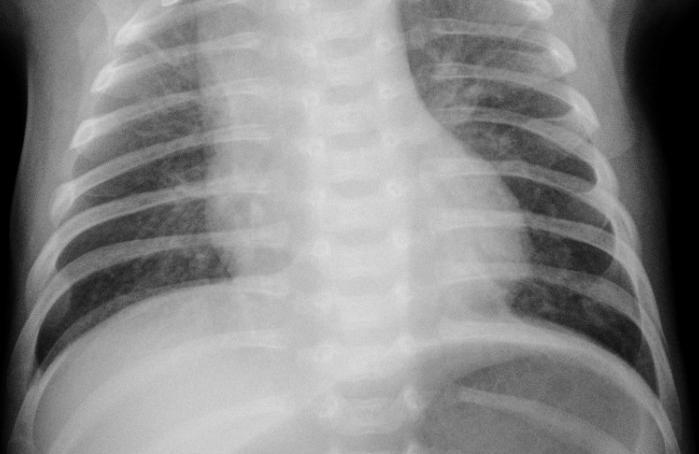

In [ ]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
img_size = (224, 224)


last_conv_layer_name = "conv2d_5"

# The local path to our target image
img_path = img_path3
display(Image(img_path))

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

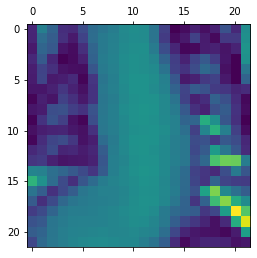

In [ ]:
img_array = preprocess_input(get_img_array(img_path, size=img_size))


# Remove last layer's softmax
model.layers[-1].activation = None



# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

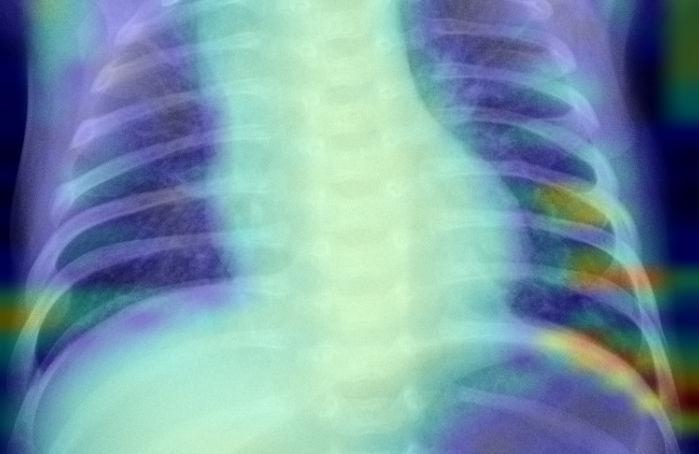

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

In [8]:
from tensorflow.keras.models import load_model
model = load_model("/content/drive/MyDrive/chest_x_ray/modelresnet50v2_1.h")

In [116]:
class0 = '/content/drive/MyDrive/chest_x_ray/test/class0'
class1 = '/content/drive/MyDrive/chest_x_ray/test/class1'
class2 = '/content/drive/MyDrive/chest_x_ray/test/class2'

In [117]:
dir_class0 = os.listdir(class0)
dir_class1 = os.listdir(class1)
dir_cclass2 = os.listdir(class2)

In [17]:
dir_class0

['img_946797649386887230.jpg',
 'img_2823915539277173272.jpg',
 'img_2948767633996308067.jpg',
 'img_27197045401768072.jpg',
 'img_4026710021364464824.jpg',
 'img_6060079403750359297.jpg',
 'img_5816741405959142545.jpg',
 'img_1575849049541638179.jpg',
 'img_1695937757547390476.jpg',
 'img_8536919923323654652.jpg']

In [118]:
import cv2
from imutils import paths
imagePaths = list(paths.list_images(class0))
data = []
labels = []
for imagePath in imagePaths:
    label = 0
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    # update the data and labels lists, respectively
    data.append(image)
    labels.append(label)
data = np.array(data) /255
labels = np.array(labels)

imagePaths1 = list(paths.list_images(class1))
data1 = []
labels1 = []
for imagePath in imagePaths1:
    label1 = 1
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data1.append(image)
    labels1.append(label1)

data1 = np.array(data1) / 255
labels1 = np.array(labels1)

imagePaths2 = list(paths.list_images(class2))
data2 = []
labels2 = []
for imagePath in imagePaths2:
    label2 = 2
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data2.append(image)
    labels2.append(label2)
data2 = np.array(data2) / 255
labels2 = np.array(labels2)

dataset = np.concatenate((data, data1, data2), axis=0)
label = np.concatenate((labels, labels1, labels2), axis=0)

label2 = to_categorical(label)

label1 = to_categorical(label)


In [119]:
imagePaths1 = list(paths.list_images(class1))
data1 = []
labels1 = []
for imagePath in imagePaths1:
    label1 = 1
    # 224x224 pixels while ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data1.append(image)
    labels1.append(label1)

data1 = np.array(data1) / 255
labels1 = np.array(labels1)

In [120]:
imagePaths2 = list(paths.list_images(class2))
data2 = []
labels2 = []
for imagePath in imagePaths2:
    label2 = 2
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    data2.append(image)
    labels2.append(label2)
data2 = np.array(data2) / 255
labels2 = np.array(labels2)

In [ ]:
imagePaths2 

In [121]:
labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [122]:
dataset = np.concatenate((data, data1, data2), axis=0)
label = np.concatenate((labels, labels1, labels2), axis=0)

In [123]:
label

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2])

In [ ]:
dataset

In [ ]:
label2 = to_categorical(label)
label2

In [ ]:
label1 = to_categorical(label)
label1

In [30]:
from sklearn.model_selection import train_test_split
(trainX, testX, trainY, testY) = train_test_split(dataset, label, test_size=0.20, stratify=label, random_state=42)
(trainX, valX, trainY, valY) = train_test_split(trainX, trainY, test_size=0.20, random_state=42)


In [89]:
testY

array([[1., 0., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.]], dtype=float32)

In [126]:
from sklearn.metrics import classification_report
BS = 8
print("[INFO] evaluating network...")
predIdxs = model.predict(dataset, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(label1.argmax(axis=1), predIdxs,digits=4))

[INFO] evaluating network...
4/4 [==============================] - 8s 2s/step
              precision    recall  f1-score   support

           0     0.8182    0.9000    0.8571        10
           1     0.5882    1.0000    0.7407        10
           2     1.0000    0.2000    0.3333        10

    accuracy                         0.7000        30
   macro avg     0.8021    0.7000    0.6437        30
weighted avg     0.8021    0.7000    0.6437        30



acc: 0.6333
sensitivity: 0.9000
specificity: 1.0000


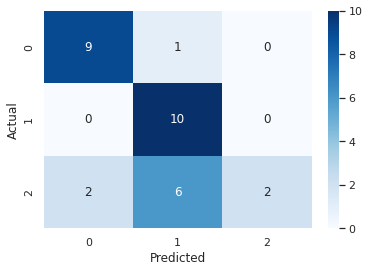

<Figure size 1152x864 with 0 Axes>

In [127]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(label1.argmax(axis=1), predIdxs)
sns.set(font_scale=1)#for label size
sns.heatmap(cm, cmap="Blues", annot=True,annot_kws={"size": 12})# font siz
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.figure(figsize = (16,12))
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print("acc: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))

1/1 [==============================] - 6s 6s/step
Total-test-data; 30 	accurately-predicted-data: 21 	 wrongly-predicted-data:  9
Accuracy: 70.0 %


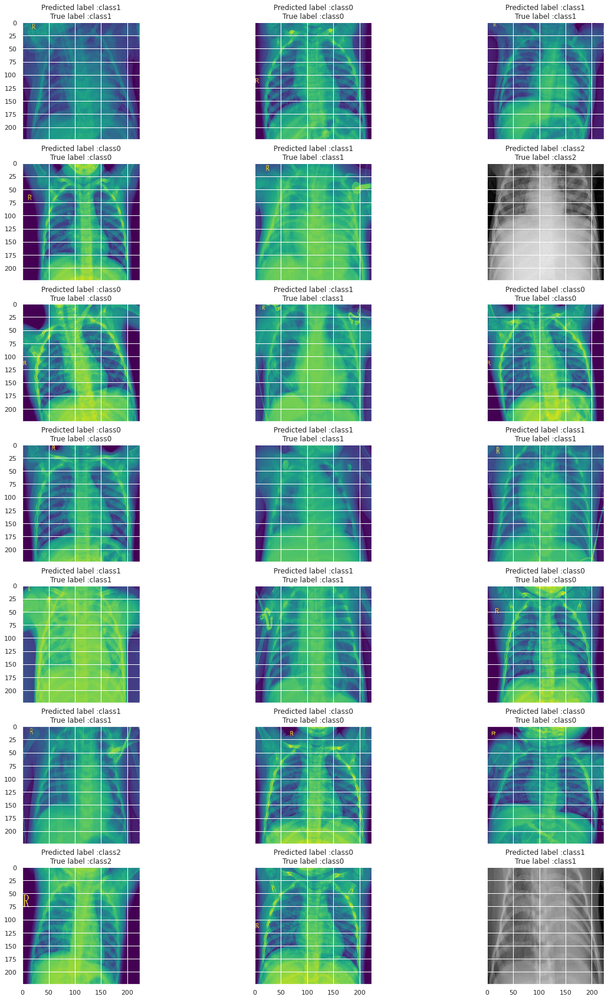

In [149]:
ypred = model.predict(dataset)
total = 0
accurate = 0
accurateindex = []
wrongindex = []

for i in range(len(ypred)):
    if np.argmax(ypred[i]) == np.argmax(label1[i]):
        accurate += 1
        accurateindex.append(i)
    else:
        wrongindex.append(i)
        
    total += 1
    
print('Total-test-data;', total, '\taccurately-predicted-data:', accurate, '\t wrongly-predicted-data: ', total - accurate)
print('Accuracy:', round(accurate/total*100, 3), '%')
label= {0: 'class0', 1: 'class1', 2: 'class2'}
imidx = random.sample(accurateindex, k=21)# replace with 'wrongindex'

nrows = 7
ncols = 3
fig, ax = plt.subplots(nrows,ncols,sharex=True,sharey=True,figsize=(20, 30))

n = 0
for row in range(nrows):
    for col in range(ncols):
            ax[row,col].imshow(dataset[imidx[n]])
            ax[row,col].set_title("Predicted label :{}\nTrue label :{}".format(label[np.argmax(ypred[imidx[n]])], label[np.argmax(label1[imidx[n]])]))
            n += 1

plt.show()